# 2 Exploratory Data Analysis Part 1<a id='2_Exploratory_Data_Analysis_Part_1'></a>

## 2.1 Contents<a id='2.1_Contents'></a>
* [2 Exploratory Data Analysis](#2_Exploratory_Data_Analysis)
  * [2.1 Contents](#2.1_Contents)
  * [2.2 Introduction](#2.2_Introduction)
    * [2.2.1 Recap of Data Science Problem](#2.2.1_Recap_of_Data_Science_Problem)
    * [2.2.2 Introduction To Notebook](#2.2.2_Introduction_To_Notebook)
  * [2.3 Objectives](#2.3_Objectives)
  * [2.4 Imports](#2.4_Imports)
  * [2.5 Load Data](#2.5_Load_Data)
  * [2.6 Exploring the Data](#2.6_Exploring_the_Data)
    * [2.6.1 Electricy Meter Readings over Time](#2.6.1_Electricity_Meter_Readings_over_Time)
    * [2.6.2 Chilled Water Meter Readings over Time](#2.6.2_Chilled_Water_Meter_Readings_over_Time)
    * [2.6.3 Steam Meter Readings over Time](#2.6.3_Steam_Meter_Readings_over_Time)
    * [2.6.4 Hot Water Meter Readings over Time](#2.6.4_Hot_Water_Meter_Readings_over_Time)
  * [2.7 Correlations with Features](#2.7_Correlations_with_Features)
    * [2.7.1 Correlations with air temperature and building size](#2.7.1_Correlations_with_air_temperature_and_building_size)

## 2.2 Introduction<a id='2.2_Introduction'></a>

### 2.2.1 Recap of Data Science Problem<a id='2.2.1_Recap_of_Data_Science_Problem'></a>

The goal of this project is to predict the building energy consumption baseline

### 2.2.2 Introduction To Notebook<a id='2.2.2_Introduction_To_Notebook'></a>

The datasets are the following:
* meter readings with energy use in kWh per hour for the year 2016. This dataset contains the building ID, the meter type (e.g., chilled water, electricity, steam, and hot water), and the meter reading.
* Details about each building. This includes the primary use of the building (e.g., education, office, etc.), number of floors, square footage, year it was built, and a site ID that links to weather data
* Weather data. This includes precipitation, cloud coverage, air temperature, dew temperature, sea level pressure, and wind direction and speed.

## 2.3 Objectives<a id='2.3_Objectives'></a>

* Plot the electricity, chilled water, hot water, and steam usage over time and look for trends. We expect to see:
    * greater electricity use during the day vs. at night
    * greater electricity use during winter and summer months
    * These should correlate with air_temperature
    * greater hot water and steam use during winter
    * greater chilled water use during summer
    * These should correlate with air_temperature and size of the building
    * Note: these trends can depend on the location of the site 
        * Example: In a site that is warm all year round, will not use chilled water
* Create a correlation matrix betweeen the target variable and all the features


* Other interesting explorations for future improvements:
    * energy usage during weekday vs. weekend
    * energy usage during holidays
    
* Other thoughts to consider:
    * If they are in the same site, and one can relate energy usage to weather data, then the energy usage profiles should have the same trends in the buildings in the same sites 
        * what could make then different?
          * building type 
            * Any buildings that wouldn't operate or have decreased operation in the summer? 
              * education

## 2.4 Imports<a id='2.4_Imports'></a>

In [1]:
#Import pandas, matplotlib.pyplot, and seaborn in the correct lines below
import pandas as pd
import numpy as np
from datetime import datetime
from scipy import stats
from matplotlib import dates
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
warnings.filterwarnings("ignore")

## 2.5 Load data<a id='2.5_Load_Data'></a>

In [2]:
# the supplied CSV data files are in the data/processed directory
#load data
data = pd.read_csv('../data/processed/merged_data_clean.csv')
building_metadata=pd.read_csv('../data/processed/building_metadata_clean.csv')
weather_data=pd.read_csv('../data/processed/weather_data_clean.csv')

# drop unnecessary columns
data=data.drop('Unnamed: 0',axis=1)
building_metadata=building_metadata.drop('Unnamed: 0',axis=1)
weather_data=weather_data.drop('Unnamed: 0',axis=1)

#add kWh/square_feet column
data['consumption_per_square_feet']=data['meter_reading']/data['square_feet']

# change the format of timestamp to datetime
data['timestamp']=pd.to_datetime(data['timestamp'],format='%Y-%m-%d %H:%M:%S')
weather_data['timestamp']=pd.to_datetime(weather_data['timestamp'],format='%Y-%m-%d %H:%M:%S')

#sort rows by timestamp
data=data.sort_values(by='timestamp')

data.head(3)

,building_id,meter,timestamp,meter_reading,meter_reading_log,month,day,dayofweek,hour,site_id,...,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed,precip_depth_1_hr_log,cloud_coverage_log,wind_speed_log,consumption_per_square_feet
2196625,166,0,2015-12-31 16:00:00,296.720000,5.696153,12,31,3,16,2,...,6.0,-5.6,NaN,1015.3,270.0,3.6,NaN,1.94591,1.526056,0.000536
2196720,206,3,2015-12-31 16:00:00,2.930700,1.368818,12,31,3,16,2,...,6.0,-5.6,NaN,1015.3,270.0,3.6,NaN,1.94591,1.526056,0.000008
2196719,206,1,2015-12-31 16:00:00,49.539762,3.922760,12,31,3,16,2,...,6.0,-5.6,NaN,1015.3,270.0,3.6,NaN,1.94591,1.526056,0.000143


In [3]:
#check the dtypes
data.dtypes

building_id                             int64
meter                                   int64
timestamp                      datetime64[ns]
meter_reading                         float64
meter_reading_log                     float64
month                                   int64
day                                     int64
dayofweek                               int64
hour                                    int64
site_id                                 int64
primary_use                            object
square_feet                             int64
year_built                            float64
floor_count                           float64
floor_count_log                       float64
square_feet_log                       float64
air_temperature                       float64
cloud_coverage                        float64
dew_temperature                       float64
precip_depth_1_hr                     float64
sea_level_pressure                    float64
wind_direction                    

## 2.6 Exploring the data<a id='2.5_Exploring_the_data'></a>

### 2.6.1 Electricy Meter Readings over Time<a id='2.6.1_Electricy_Meter_Readings_over_Time'></a>

First, create a function to plot the data

In [4]:
def plot_energy_readings_by_meter(meter,window=0):

    meter_types={0:'electricity', 1:'chilled_water',2:'steam',3:'hot_water'} #get electricity meter_readings only
    energy_type=meter_types[meter]
    by_meter=(data['meter']==meter)
    energy_usage=data[by_meter]
    site_ids=sorted(list(energy_usage.site_id.unique()))
    for site_id in site_ids:
        by_site=(energy_usage['site_id']==site_id)
        site_energy_usage=energy_usage[by_site]
        building_ids=sorted(list(site_energy_usage.building_id.unique()))
        number_buildings=len(building_ids)
        figure_rows=np.ceil(number_buildings/5)
        fig,ax=plt.subplots(int(figure_rows),5,figsize=(12,int(figure_rows)))
        for i in range(len(building_ids)):
            by_building=(site_energy_usage['building_id']==building_ids[i])
            building_energy=site_energy_usage[by_building]
            time=building_energy['timestamp']
            if window==0:
                electricity_use=building_energy['meter_reading']
            else:
                electricity_use=building_energy['meter_reading'].interpolate('index').rolling(window).mean()
            row=int(np.floor(i/5))
            column=i%5
            if len(building_ids) > 5:
                ax[row][column].plot(time,electricity_use)
                ax[row][column].set_xticks([])
                ax[row][column].set_title('%s' %(building_ids[i]))
            else:
                ax[column].plot(time,electricity_use)
                ax[column].set_xticks([])
                ax[column].set_title('%s' %(building_ids[i]))
        plt.suptitle('%s, site ID = %s' %(energy_type,site_id))
        plt.tight_layout()
        plt.show()

0


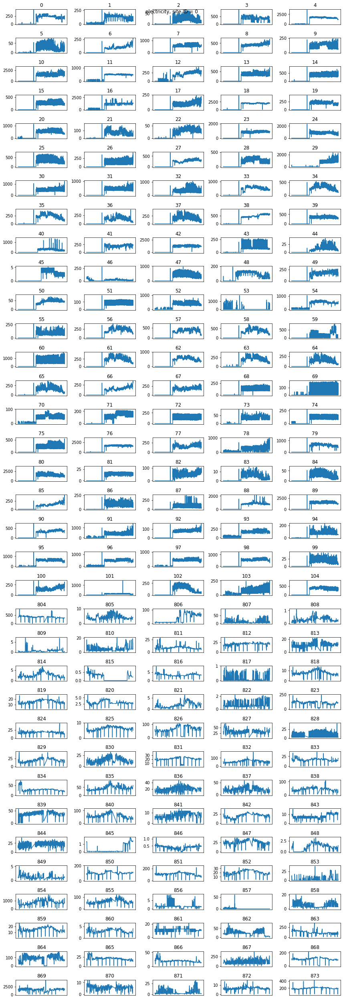

1


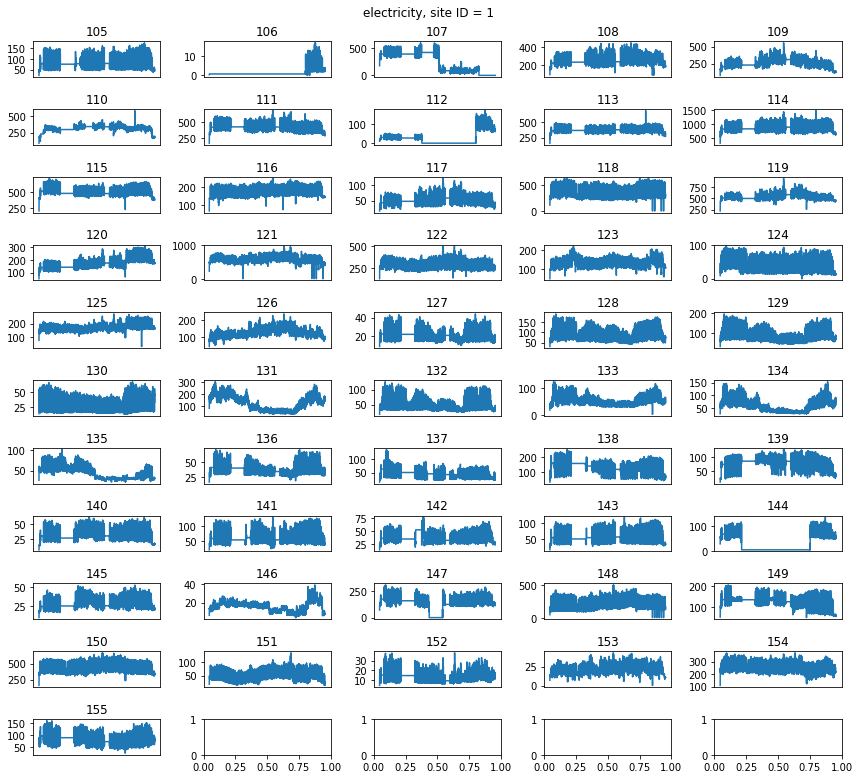

2


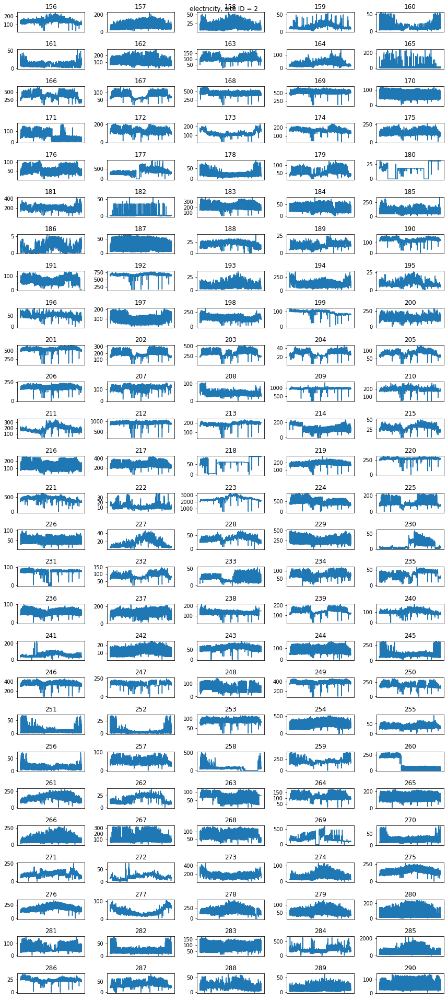

3


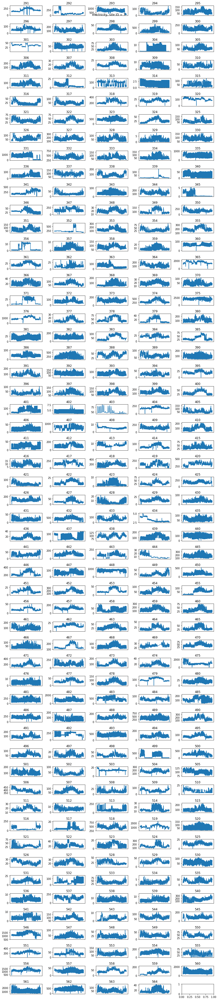

4


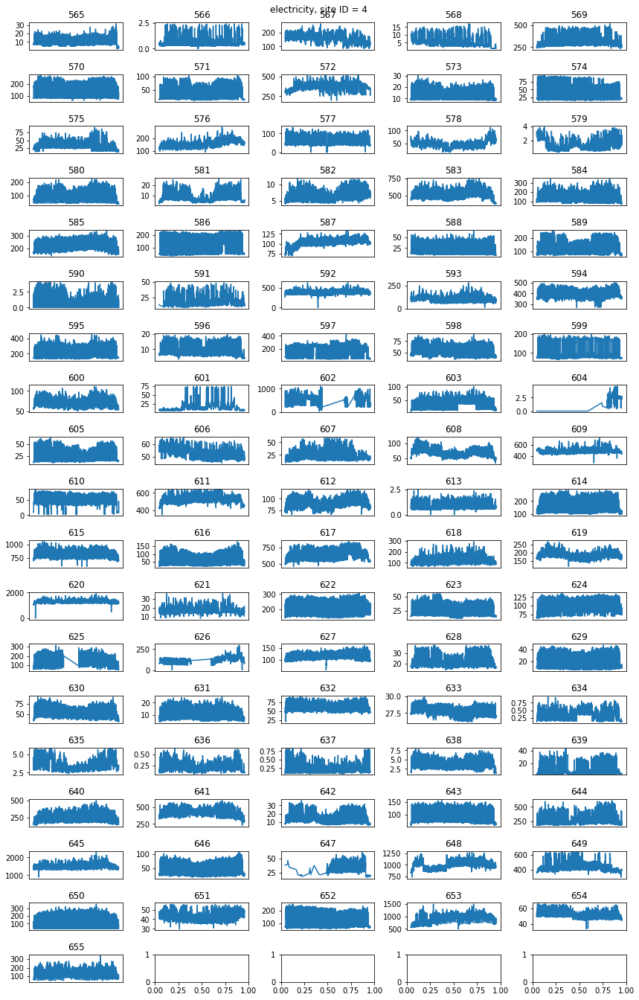

5


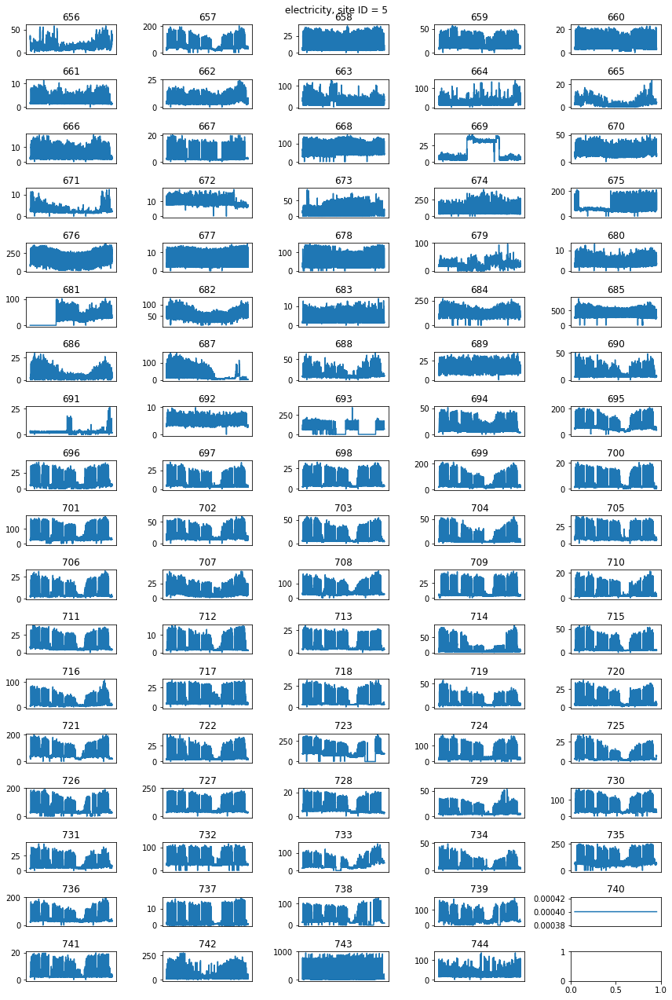

6


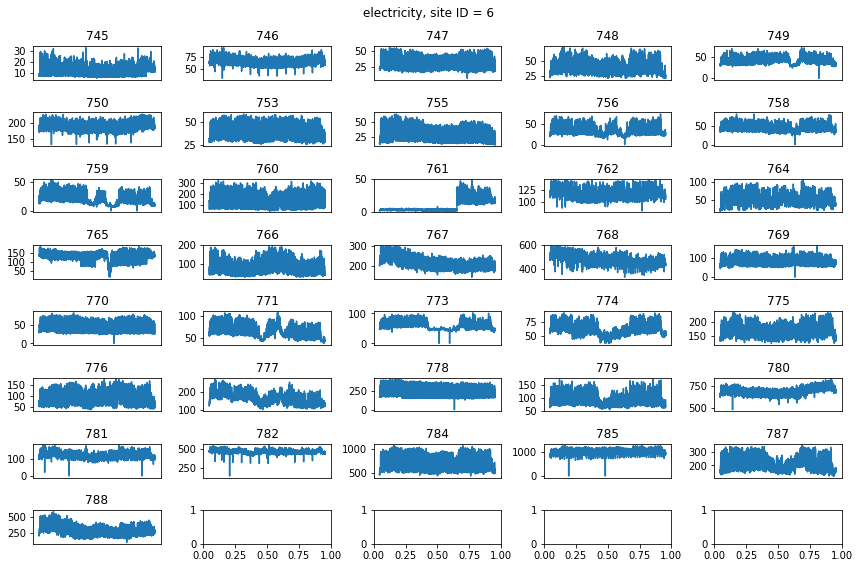

7


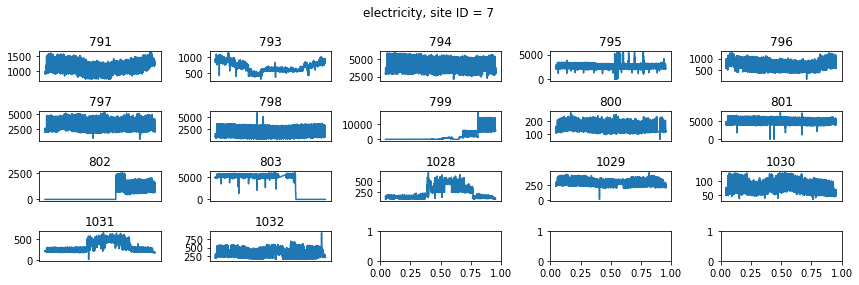

9


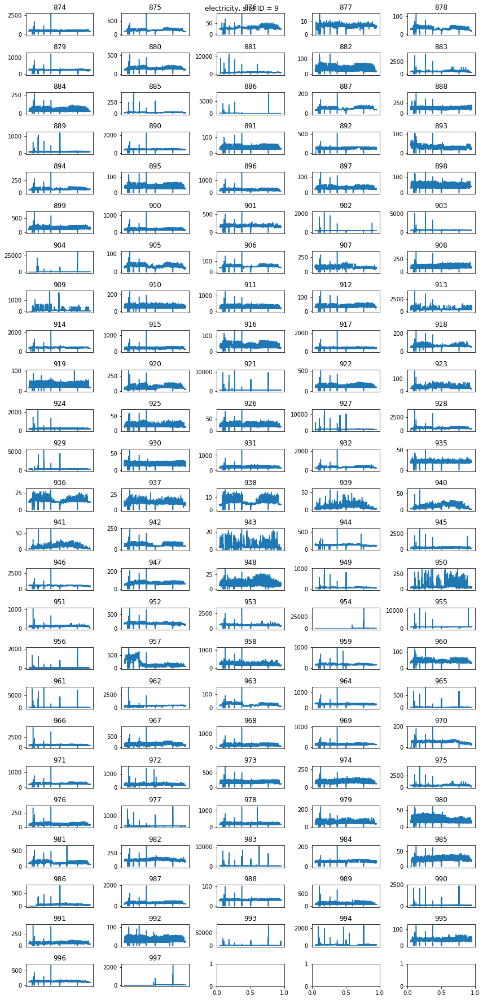

10


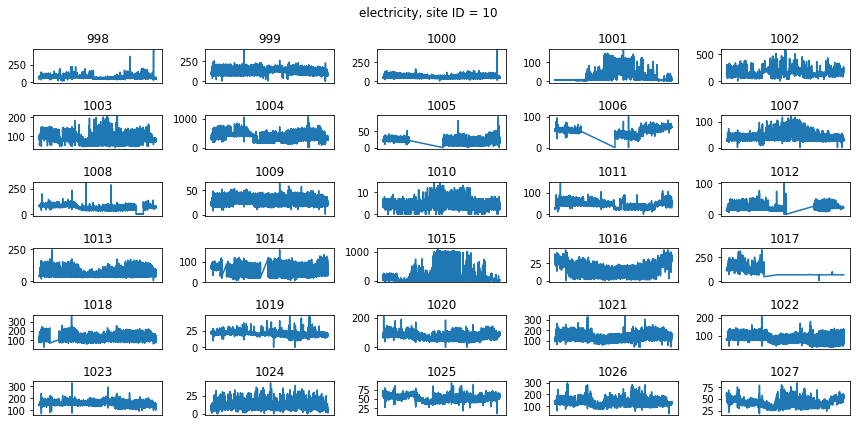

12


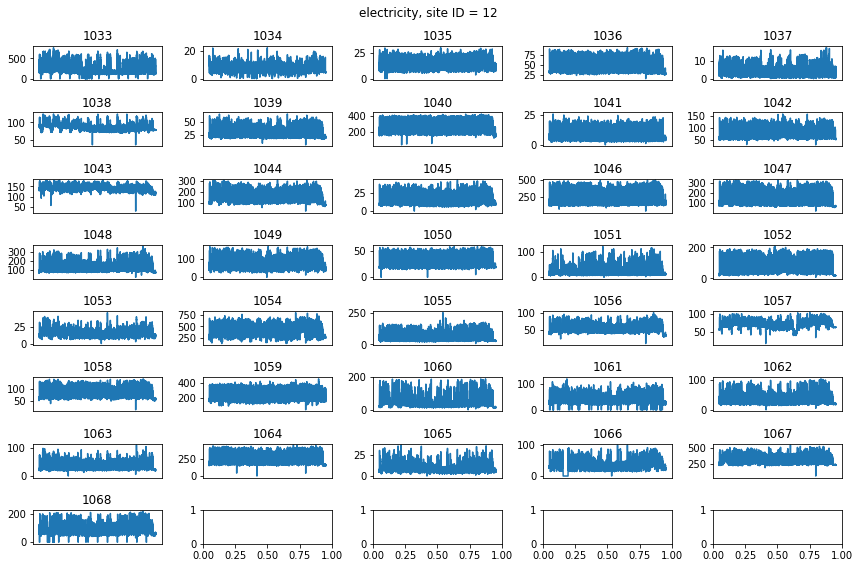

13


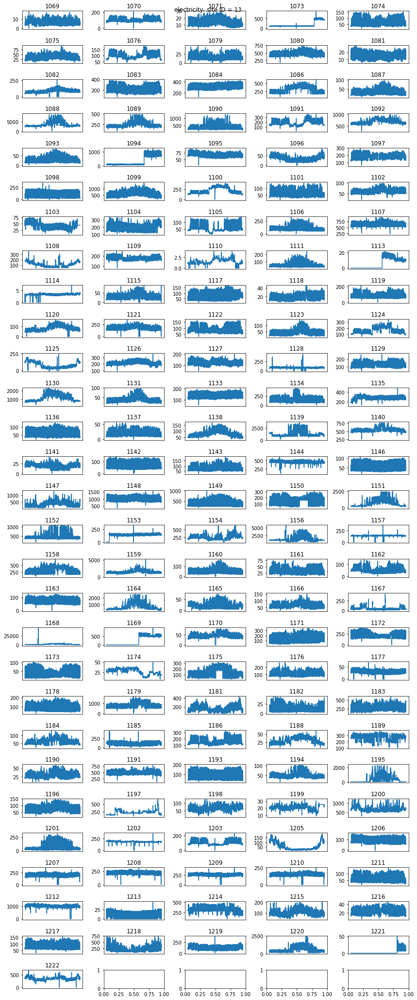

14


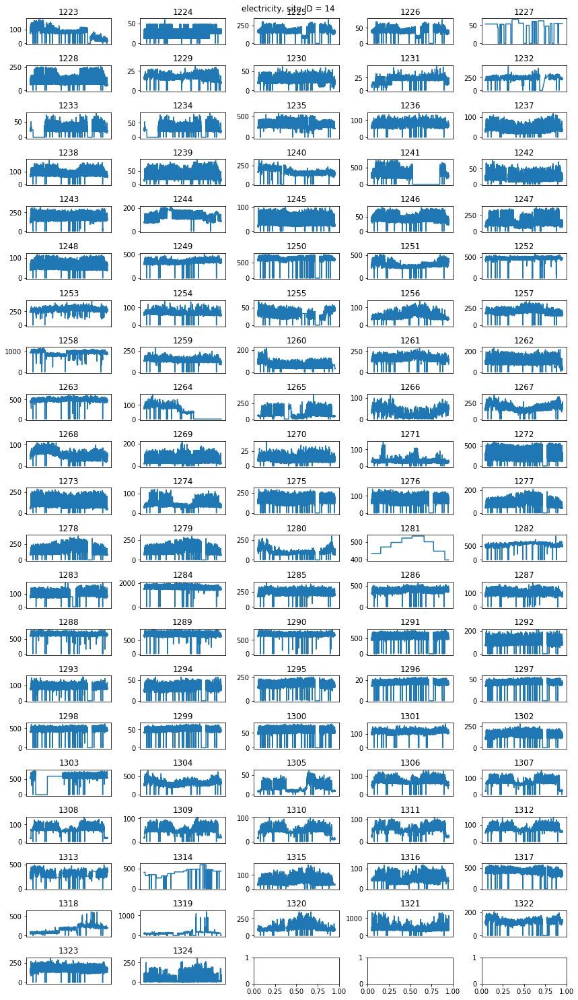

15


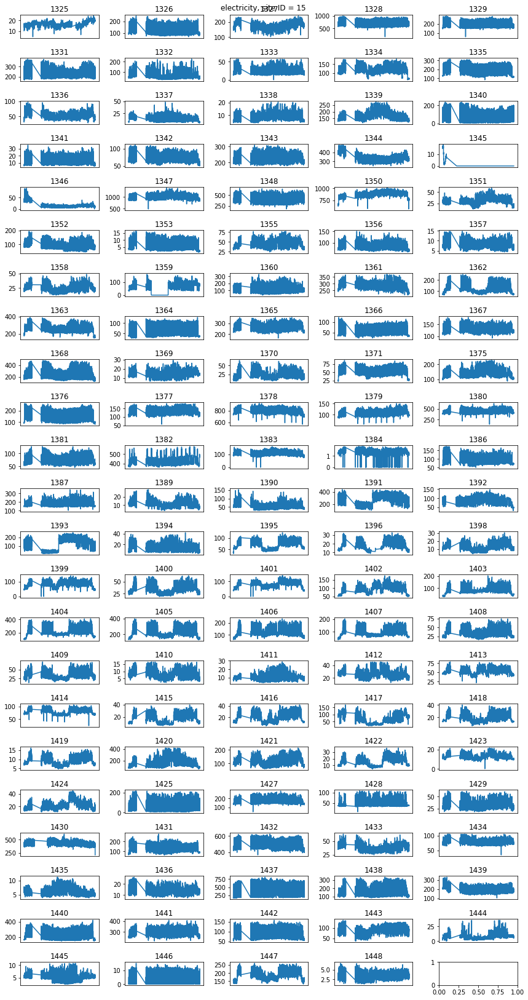

In [115]:
plot_energy_readings_by_meter(0)

* buildings in site 15 are missing readings in the beginning of the year 
* buildings in site 0 have meter readings of 0 until about May
* some buildings have spikes of high meter readings which could be outliers, but can also be averaged using a rolling average, ex: 994
* some buildings, like 669, very low at first, then very high in the middle of the year. 
* building 1281 has very little data

what are ways to handle this?

* get rid off the data from site 0 and start the readings from May
* use a hampel filter https://medium.com/wwblog/clean-up-your-time-series-data-with-a-hampel-filter-58b0bb3ebb04

Next, I will smooth out the data to have a clearer view of the trends

Sites 0, 2, 4, and 9, which have temperatures similar to Jacksonville, Pheonix, San Francisco, and San Antonio, respectively, have temperatures higher than 50 C, whose corresponding buildings I don't think would need heating during cold weather. So in the plots below, in these sites, I'd expect higher peaks during summer compared to other sites. Also, in these sites steam and and hot water meter readings should be low.  
* This is observed in some buildings but not all of them 

Some things that could also be looked at:
* Identify buildings with similar energy consumption profiles within each site_id. Are they the same type?
  * So exmples are:
    * Those with a dip in the summer
    * Those with high consumption in winter and summer, and dips in between
    * Those with high consumption only in the summer

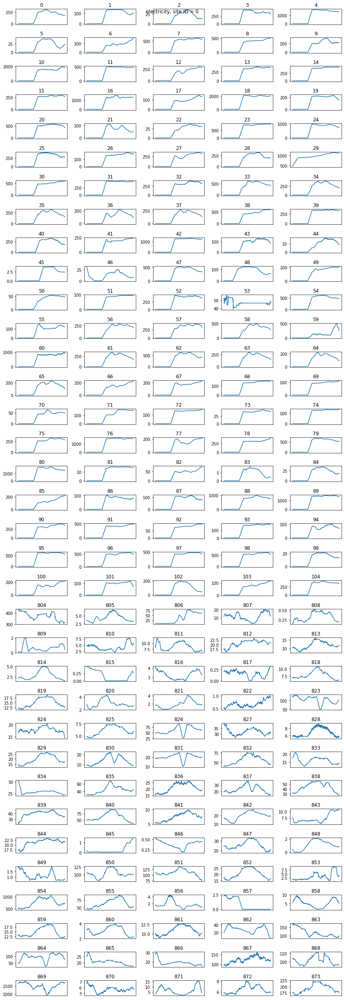

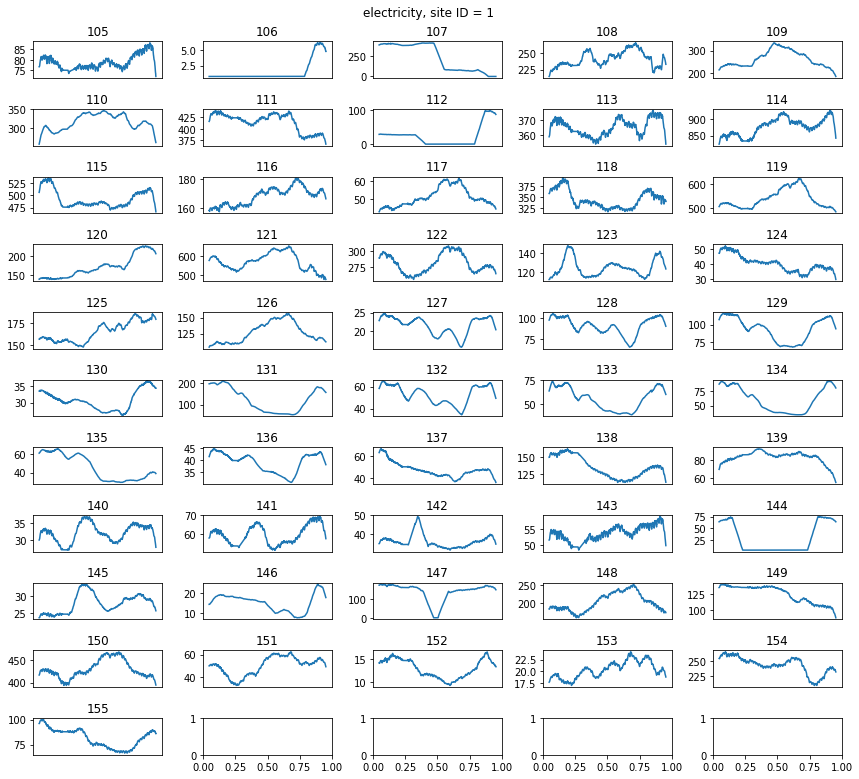

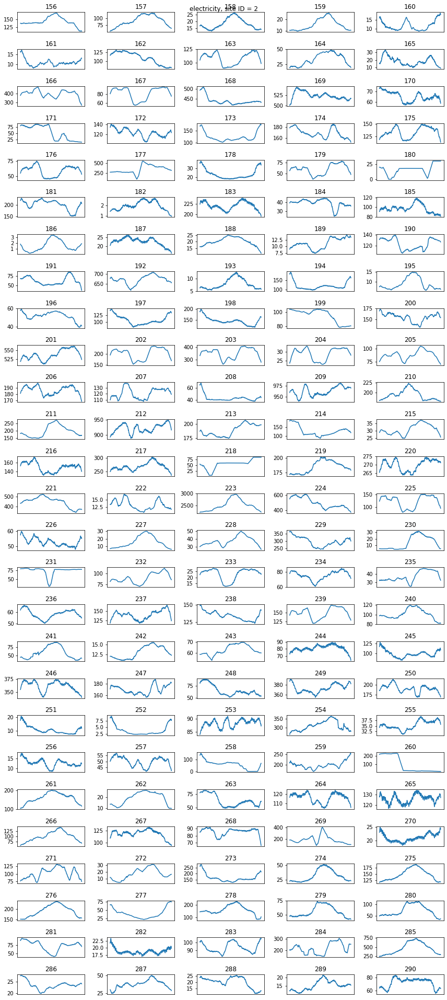

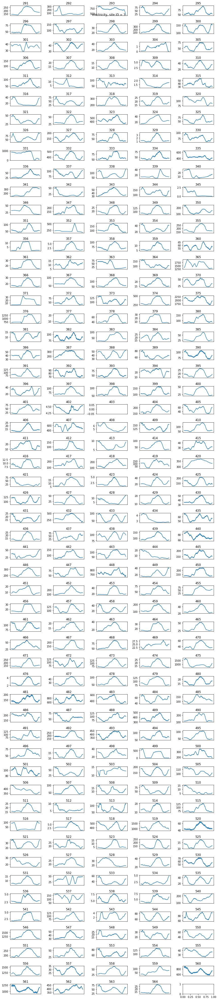

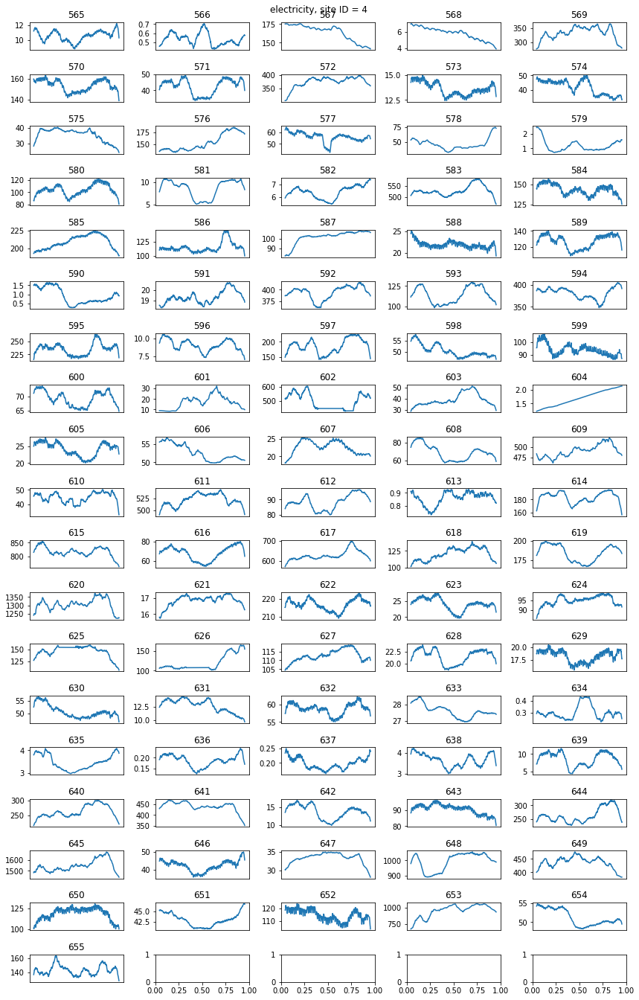

...

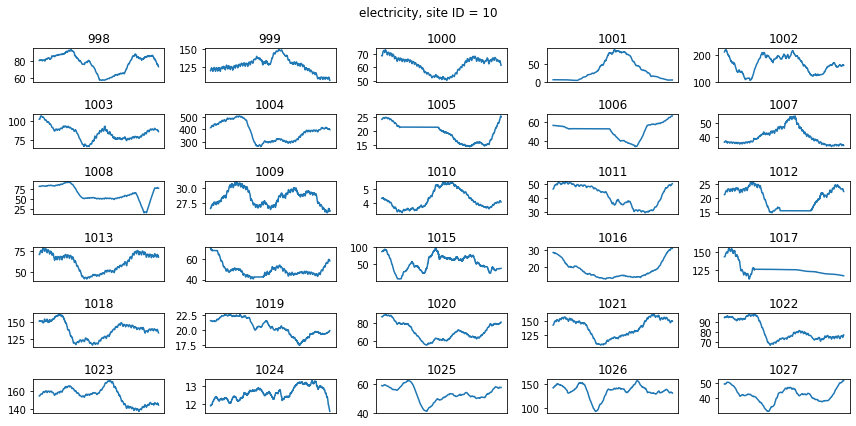

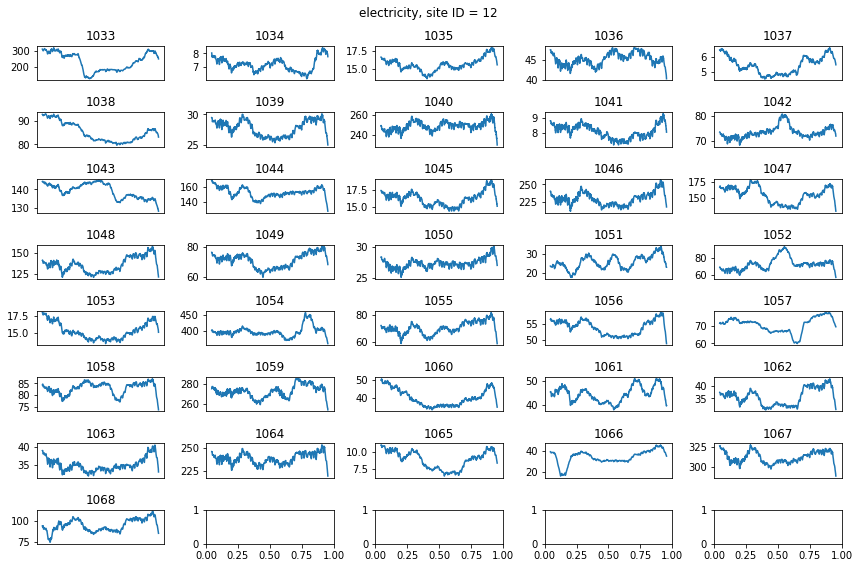

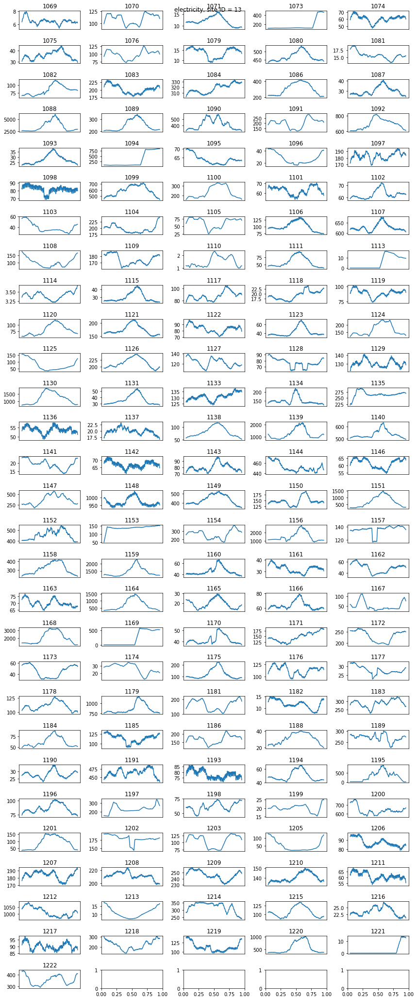

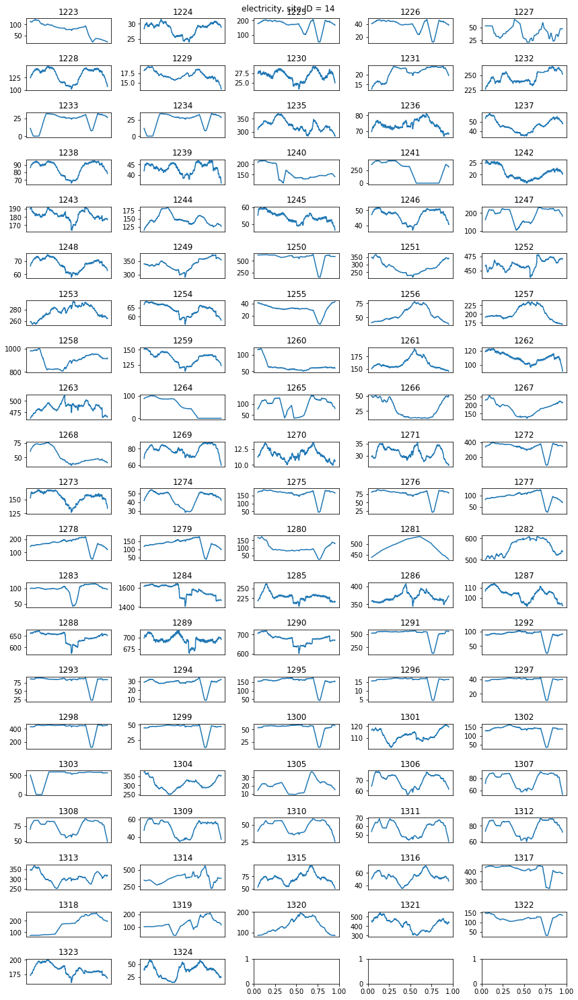

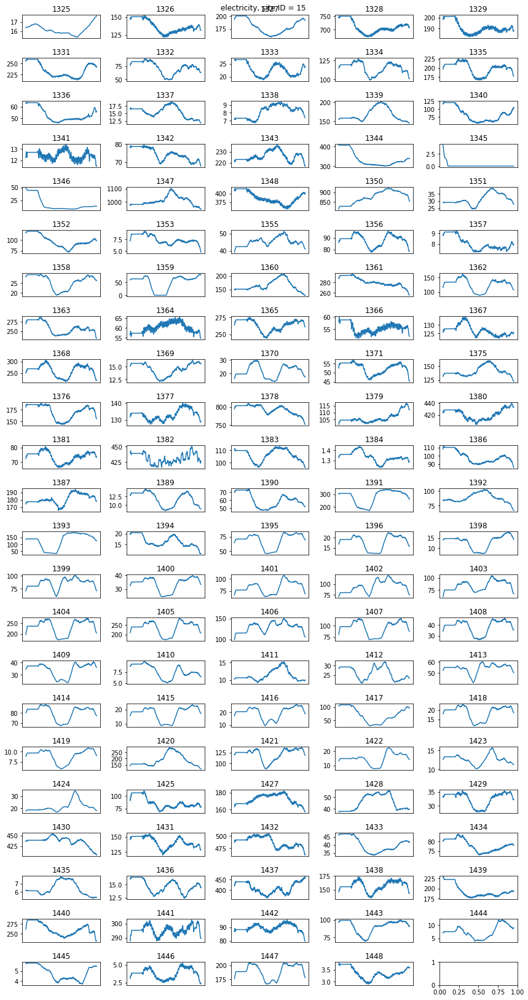

In [117]:
plot_energy_readings_by_meter(0,720)

### 2.6.2 Chilled Water Meter Readings over Time<a id='2.6.2_Chilled_Water_Meter_Readings_over_Time'></a>

As expected, chilled water use is higher during summer

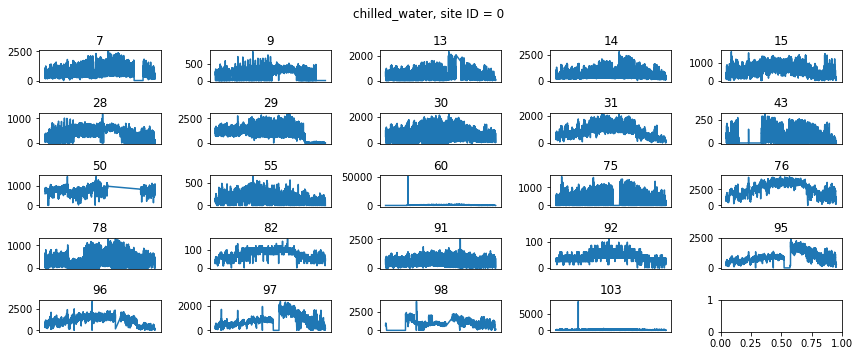

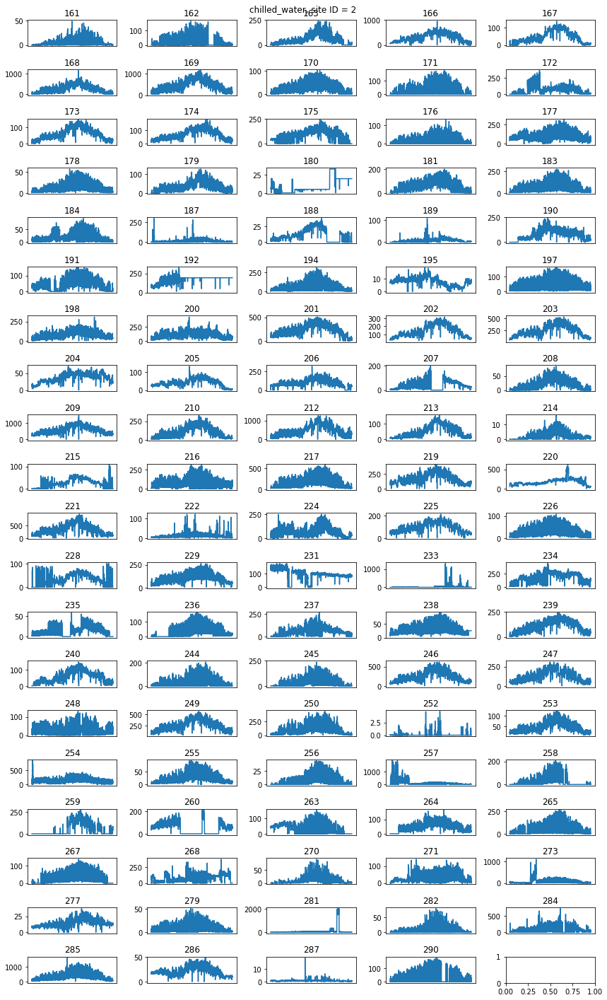

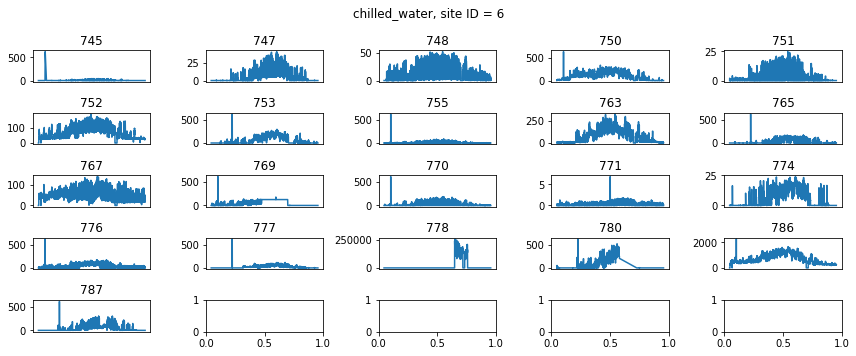

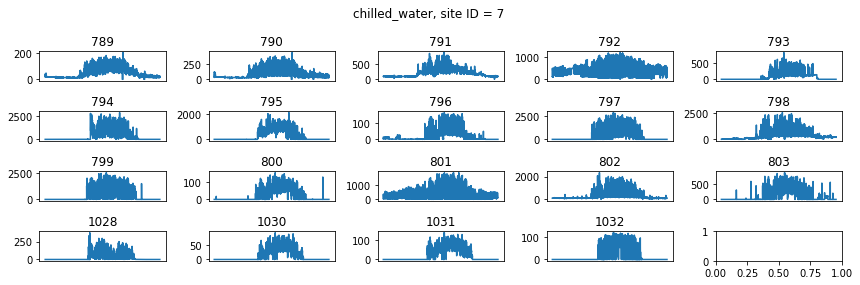

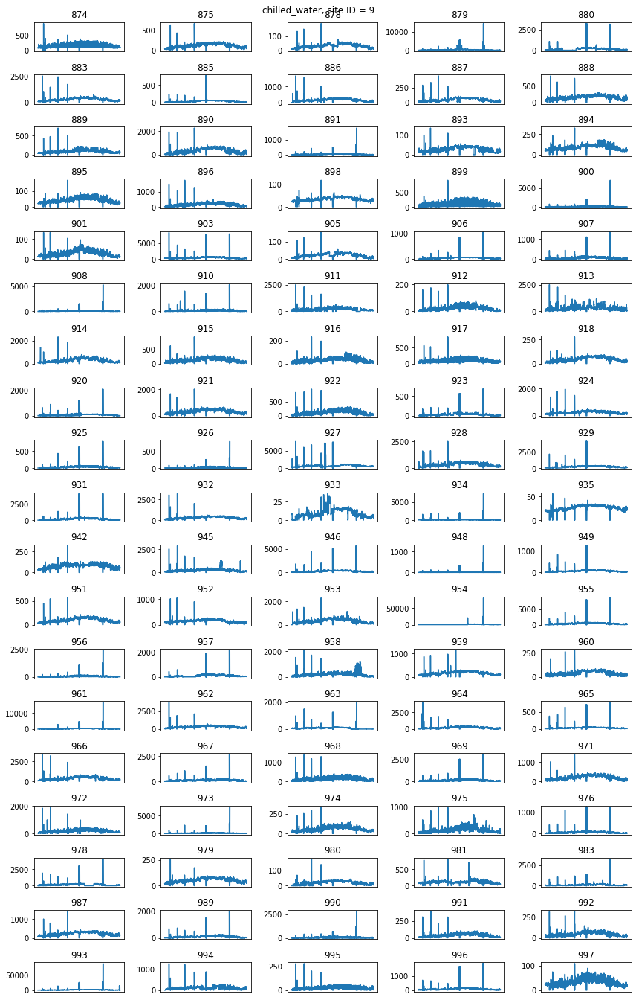

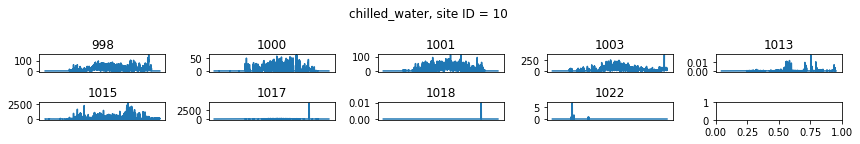

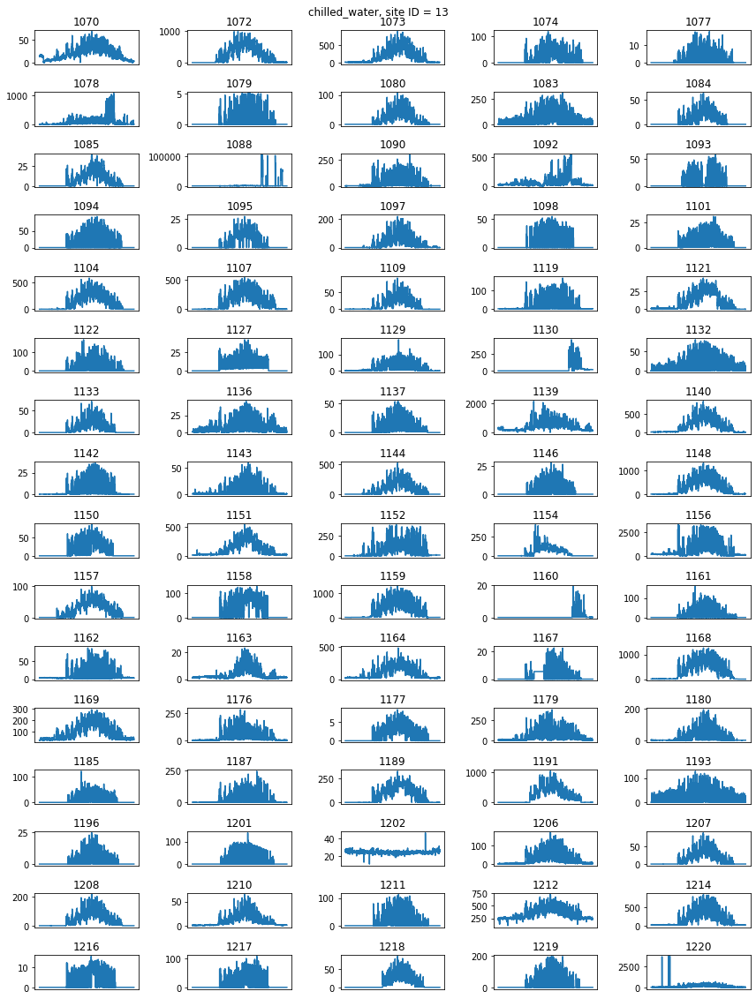

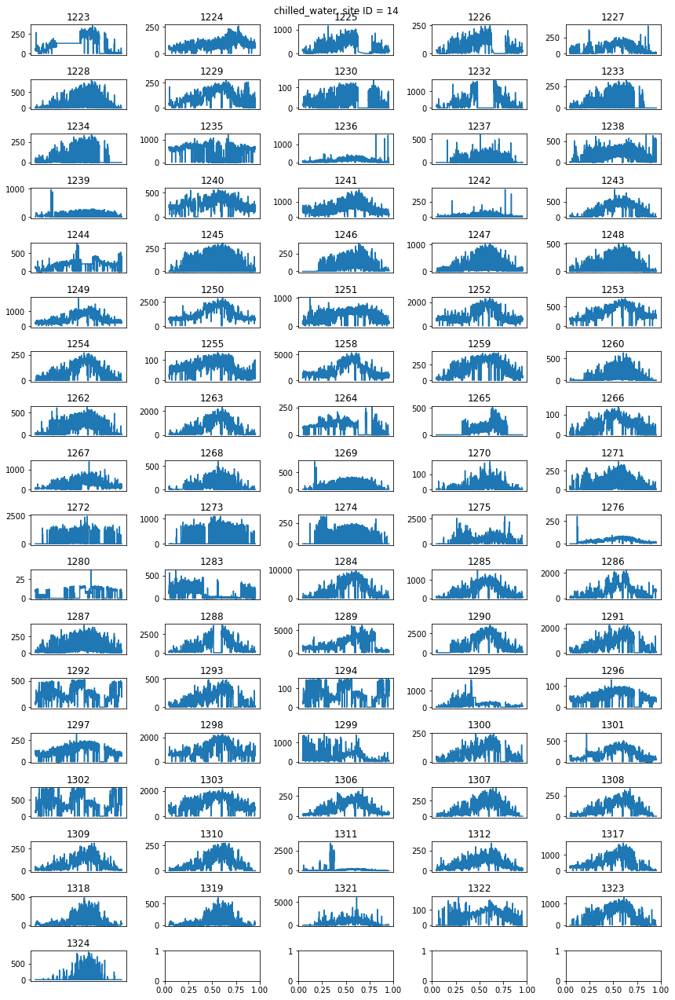

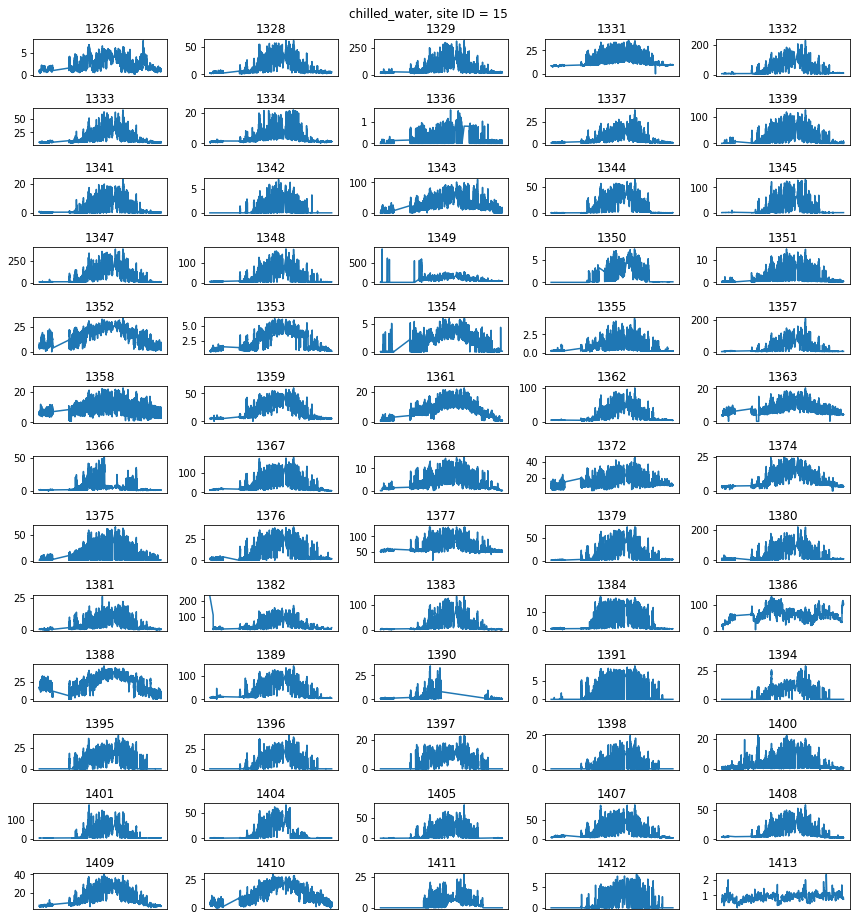

In [118]:
plot_energy_readings_by_meter(1)

Next, I will smooth out the data to have a clearer view of the trends

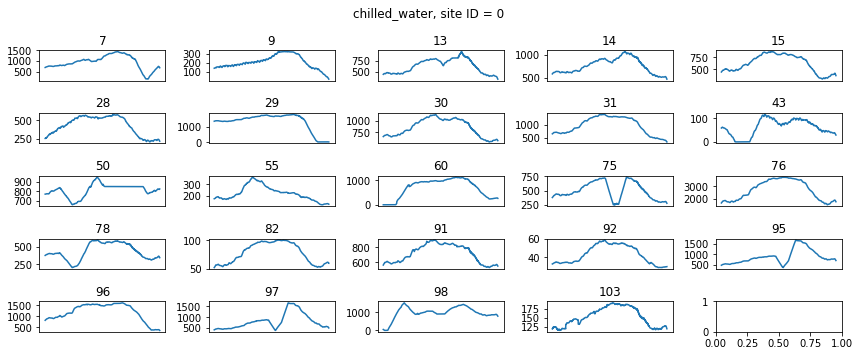

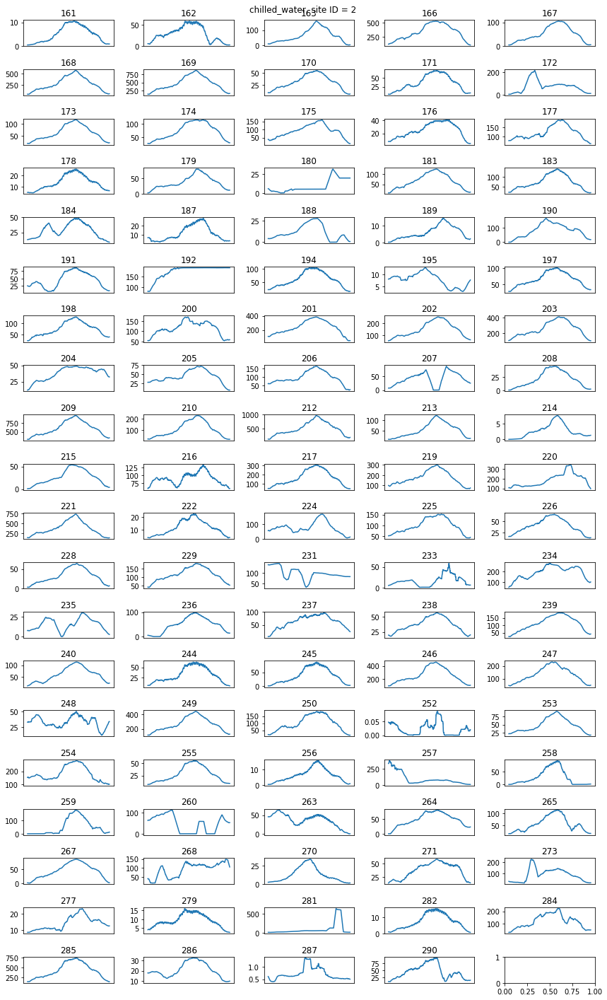

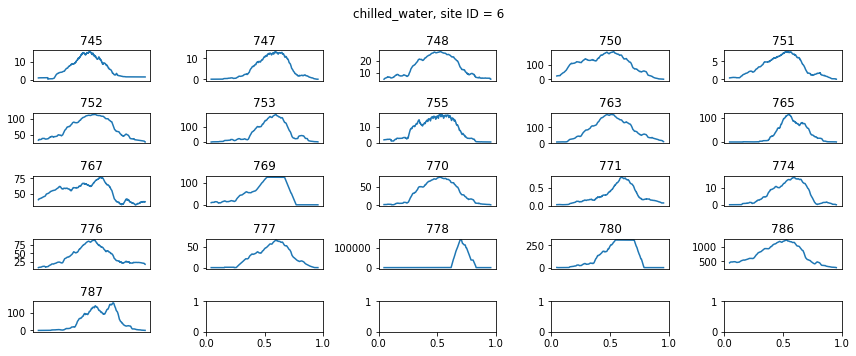

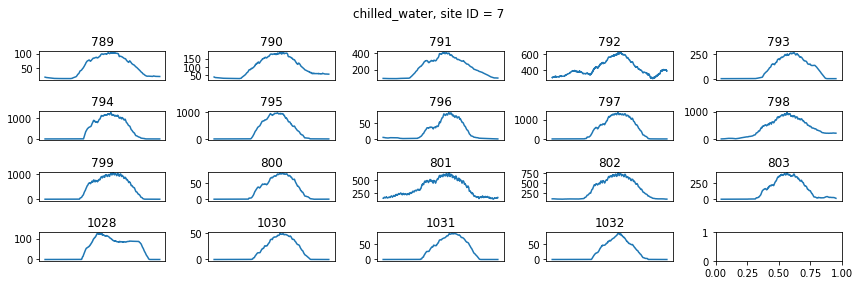

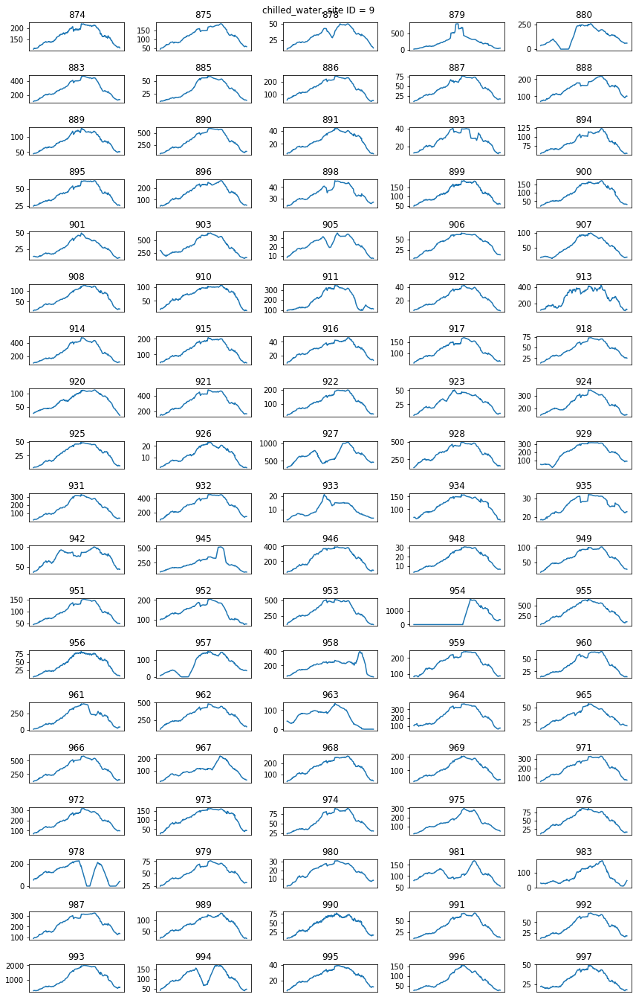

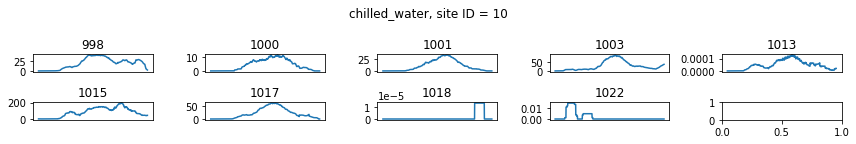

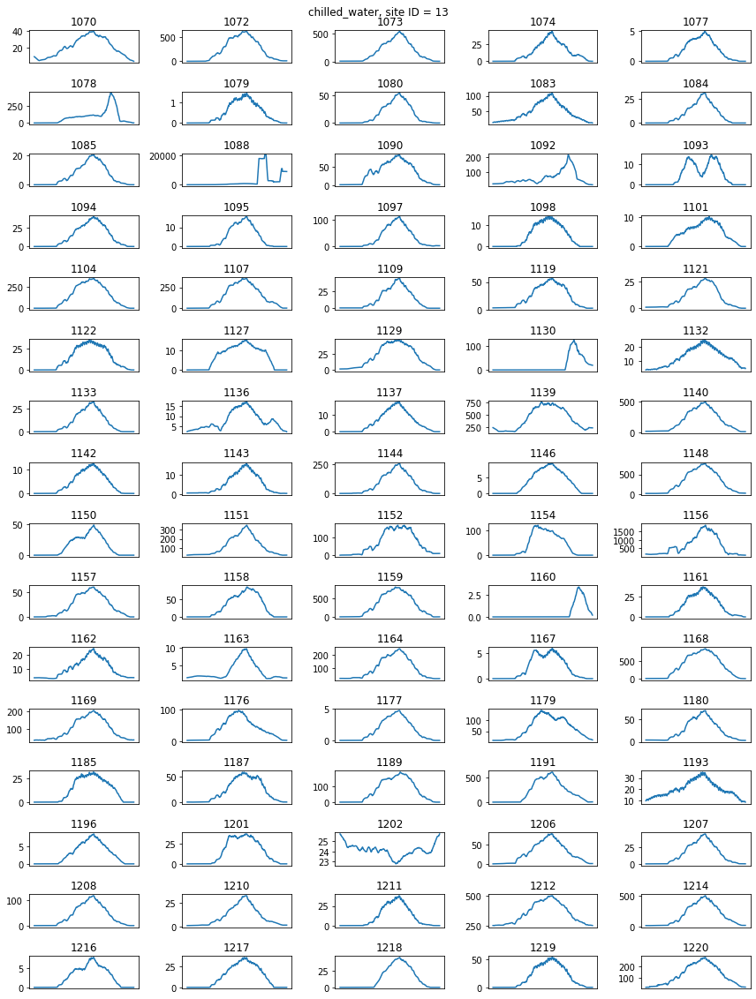

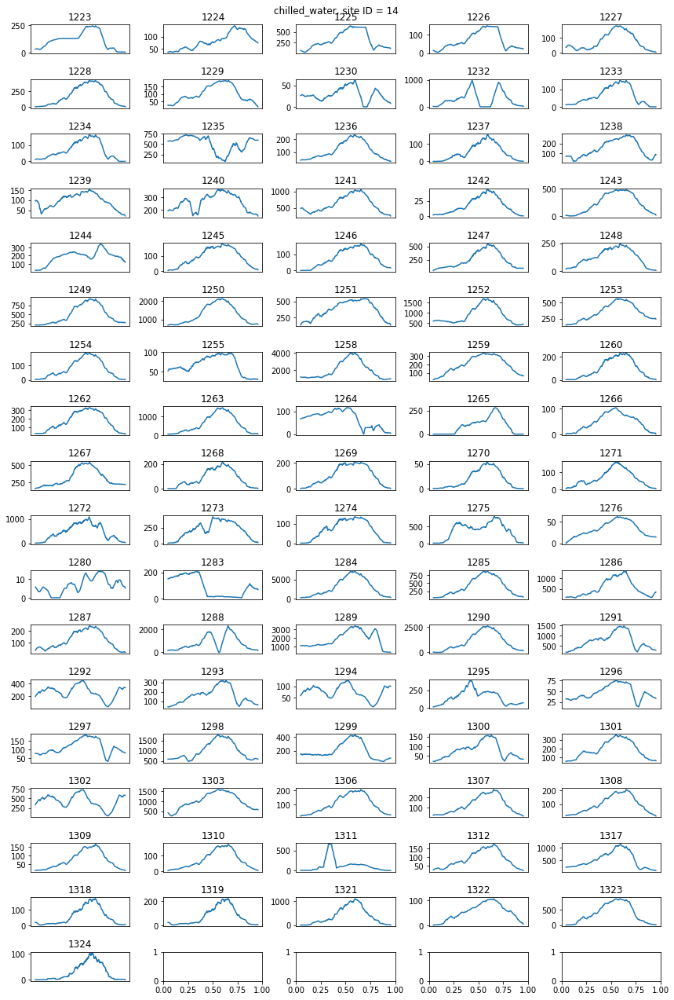

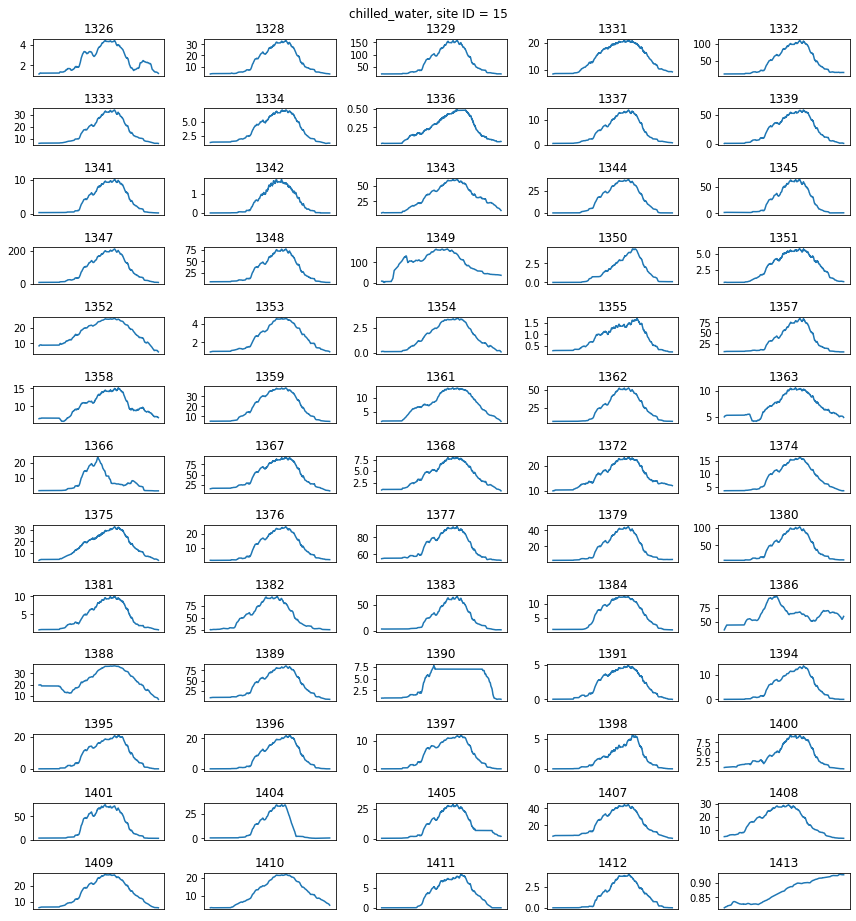

In [120]:
plot_energy_readings_by_meter(1,720)

### 2.6.3 Steam Meter Readings over Time<a id='2.6.3_Steam_Meter_Readings_over_Time'></a>

As expected, there is a dip in the meter readings during summer

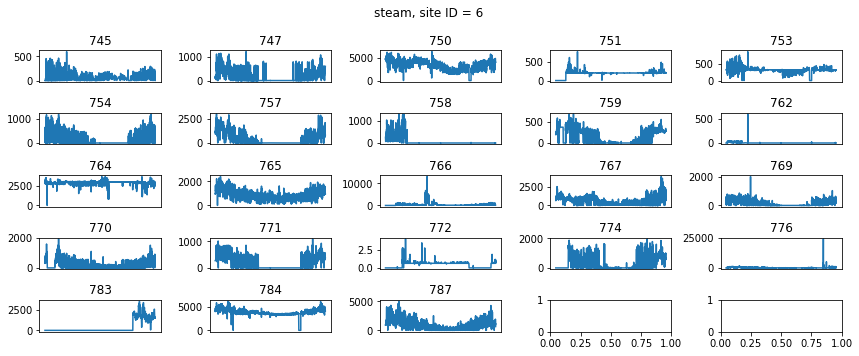

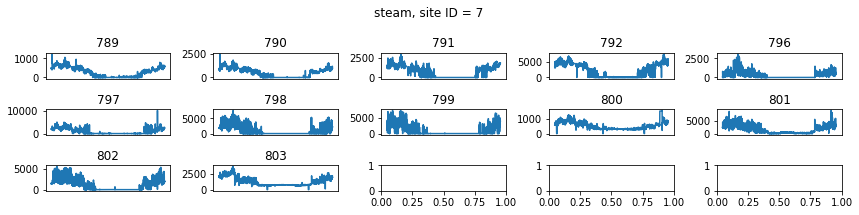

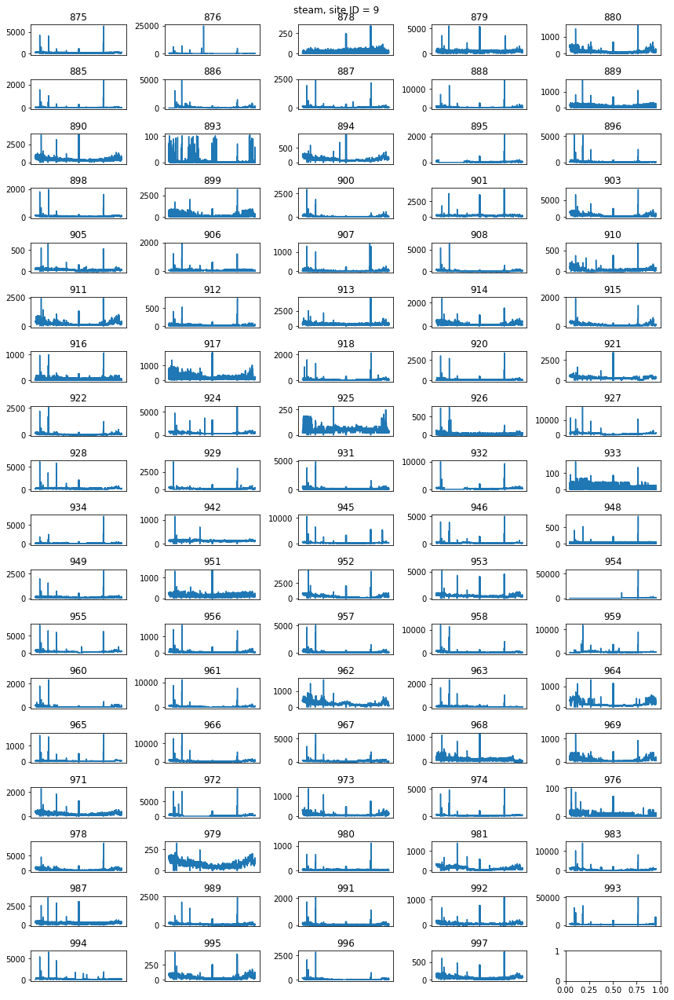

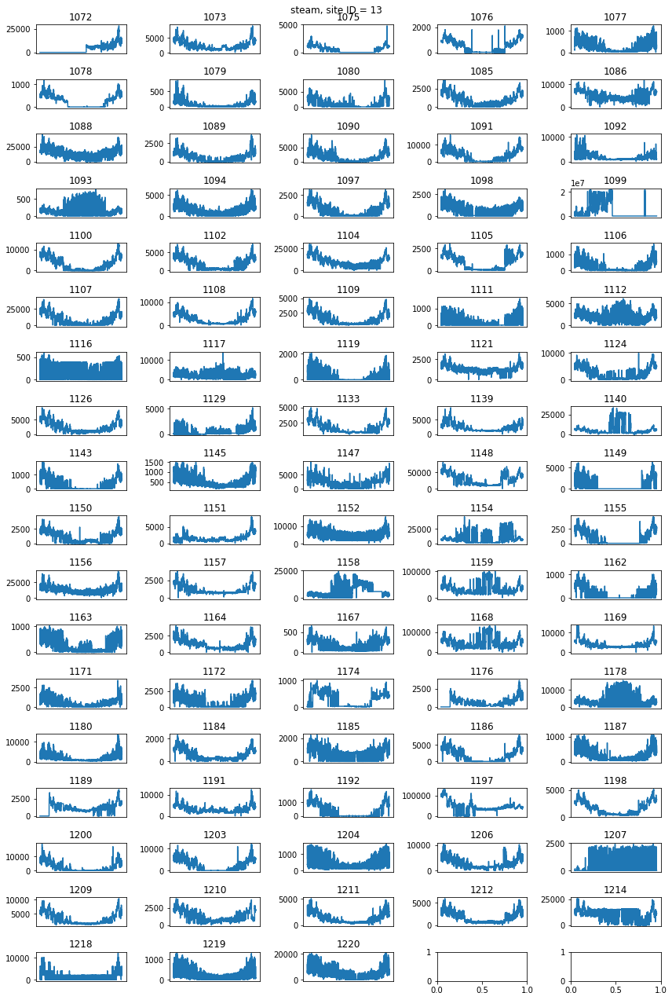

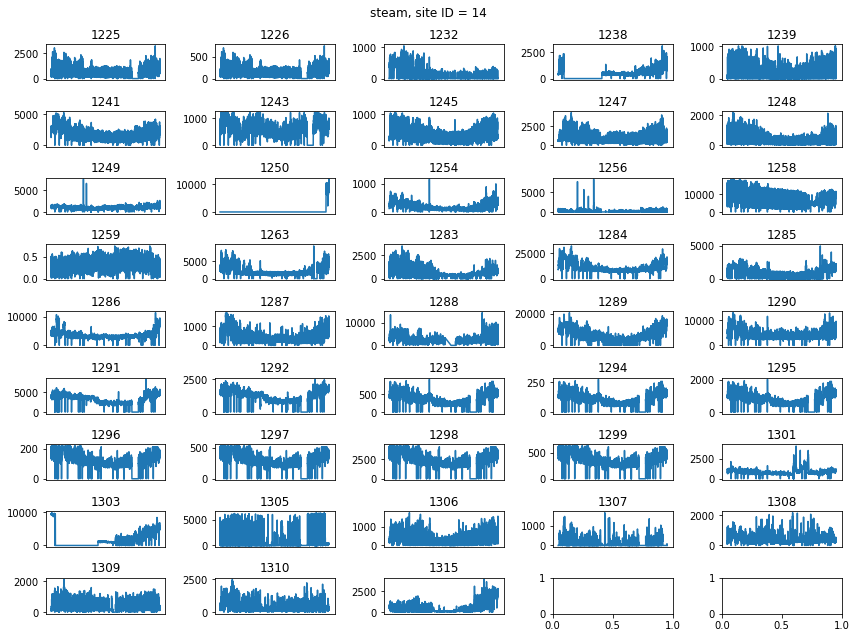

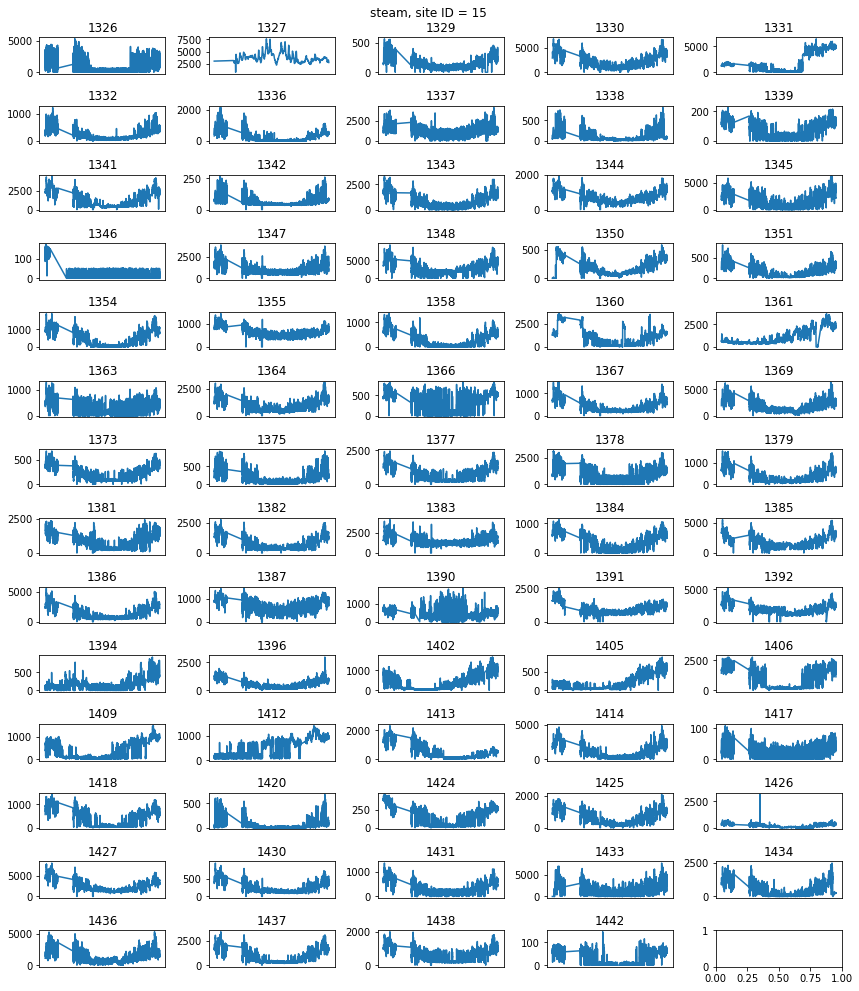

In [121]:
plot_energy_readings_by_meter(2)

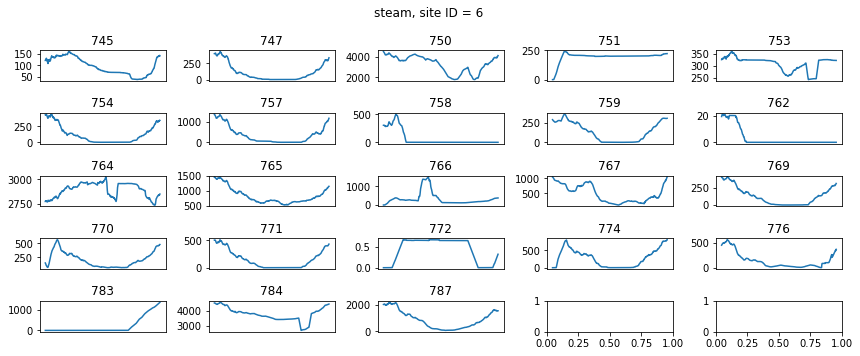

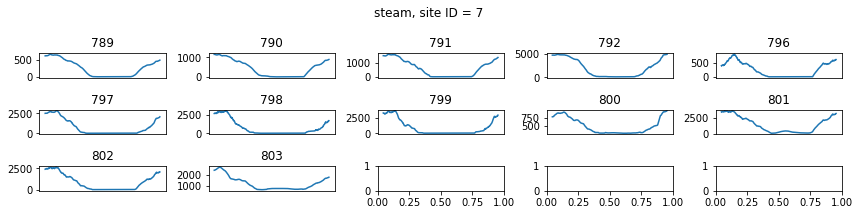

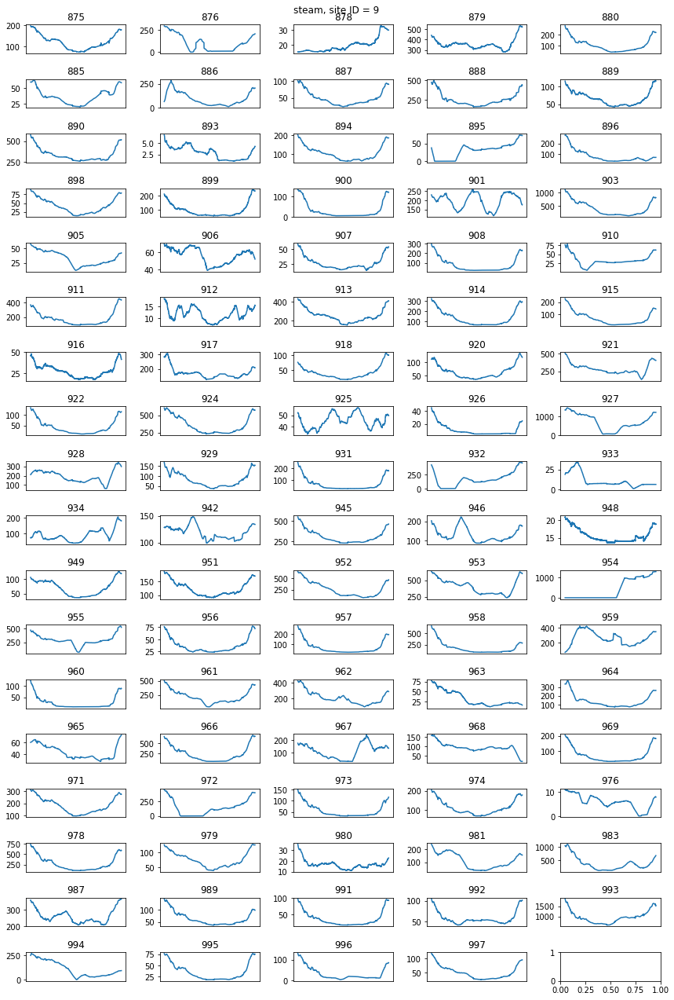

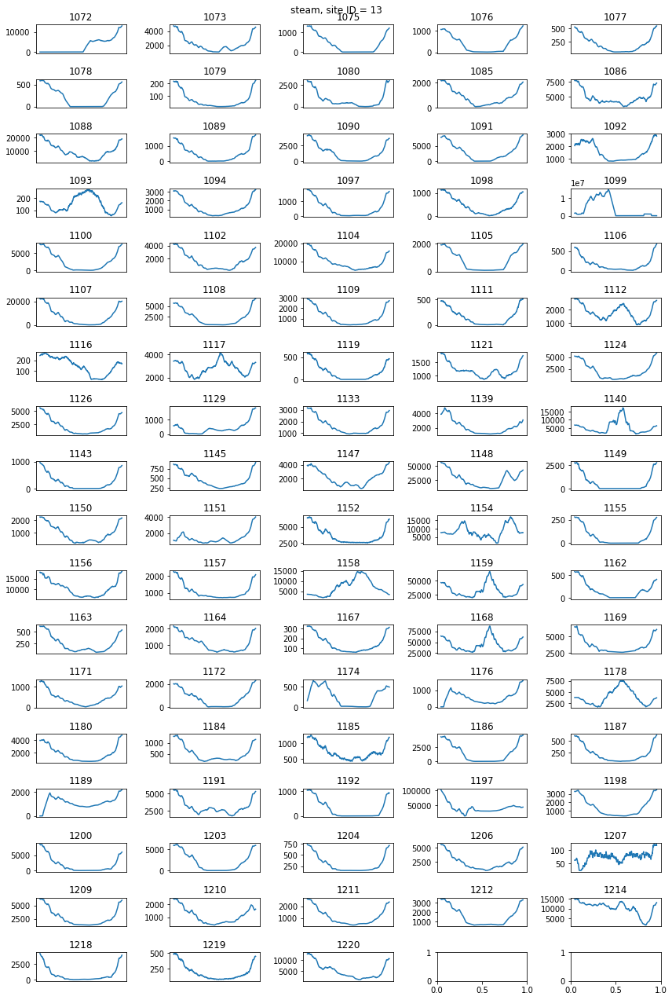

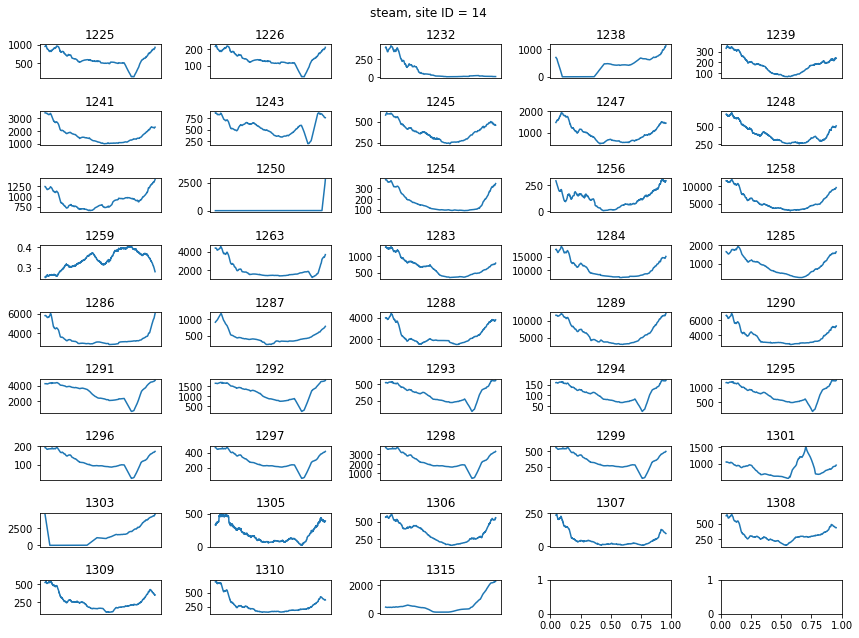

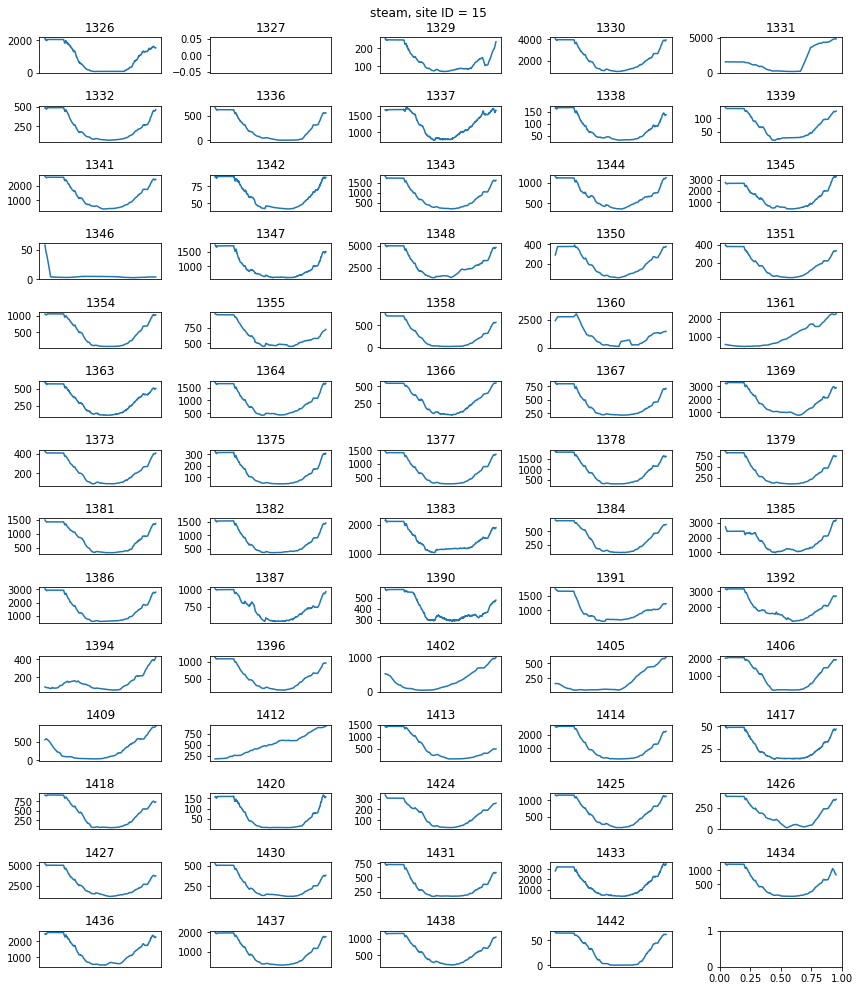

In [122]:
plot_energy_readings_by_meter(2,720)

### 2.6.4 Hot Water Meter Readings over Time<a id='2.6.4_Hot_Water_Meter_Readings_over_Time'></a>

as expected, there is a dip in the meter readings during summer

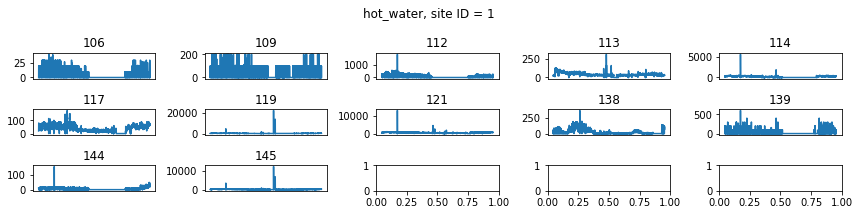

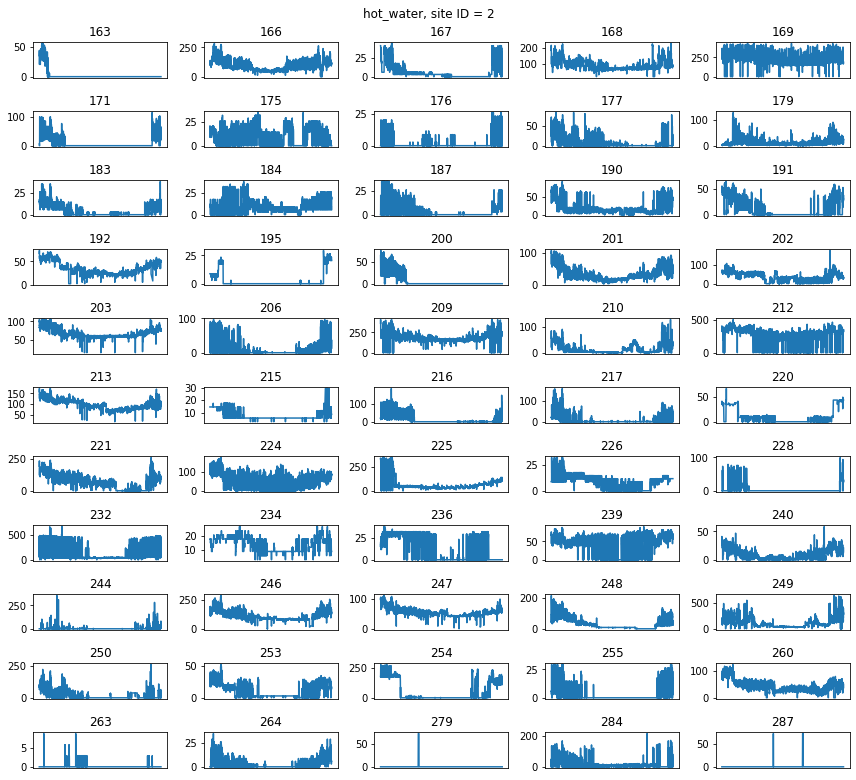

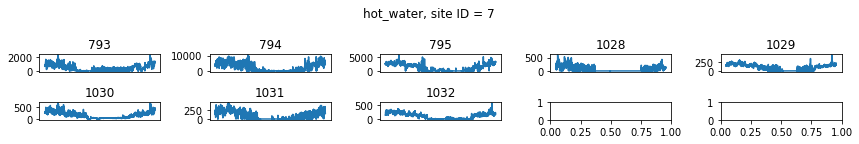

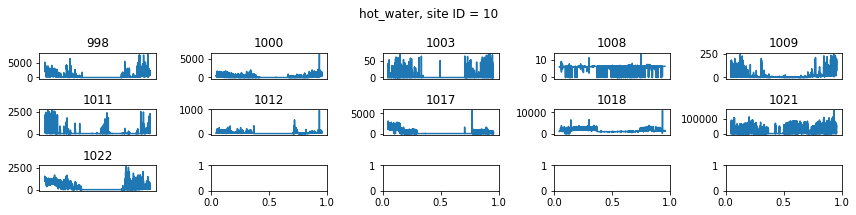

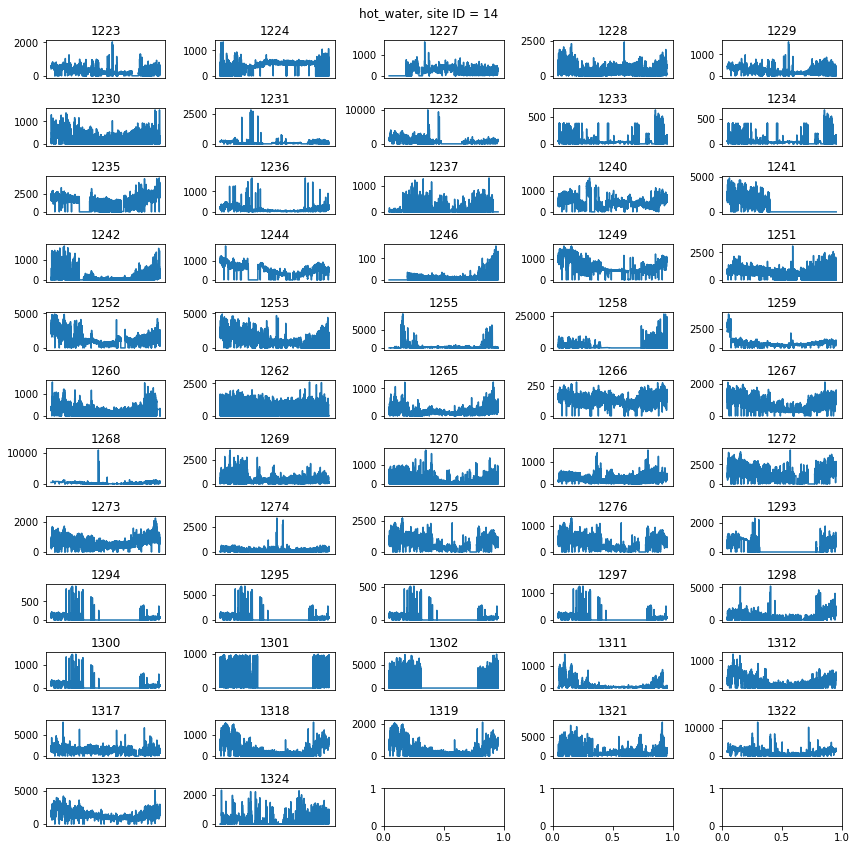

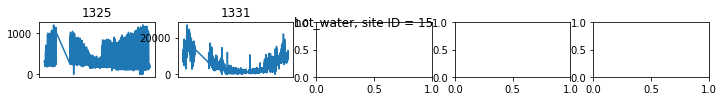

In [6]:
plot_energy_readings_by_meter(3)

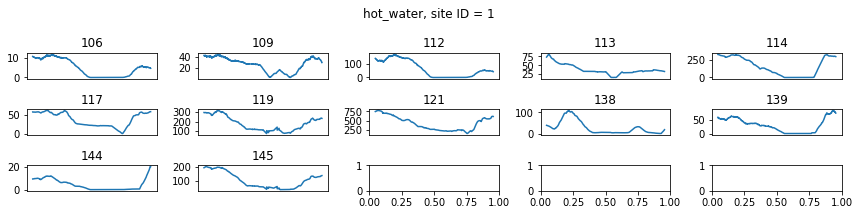

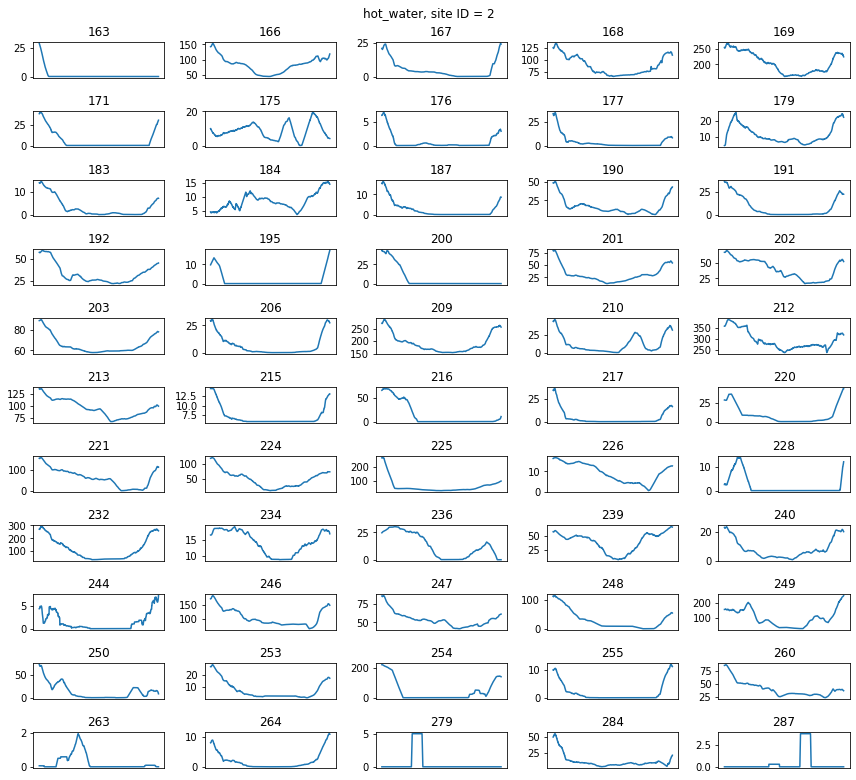

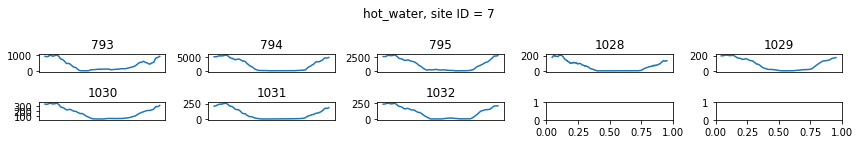

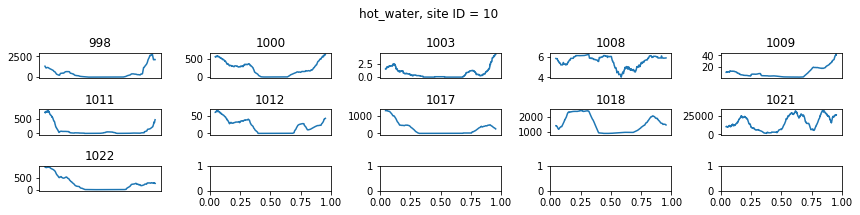

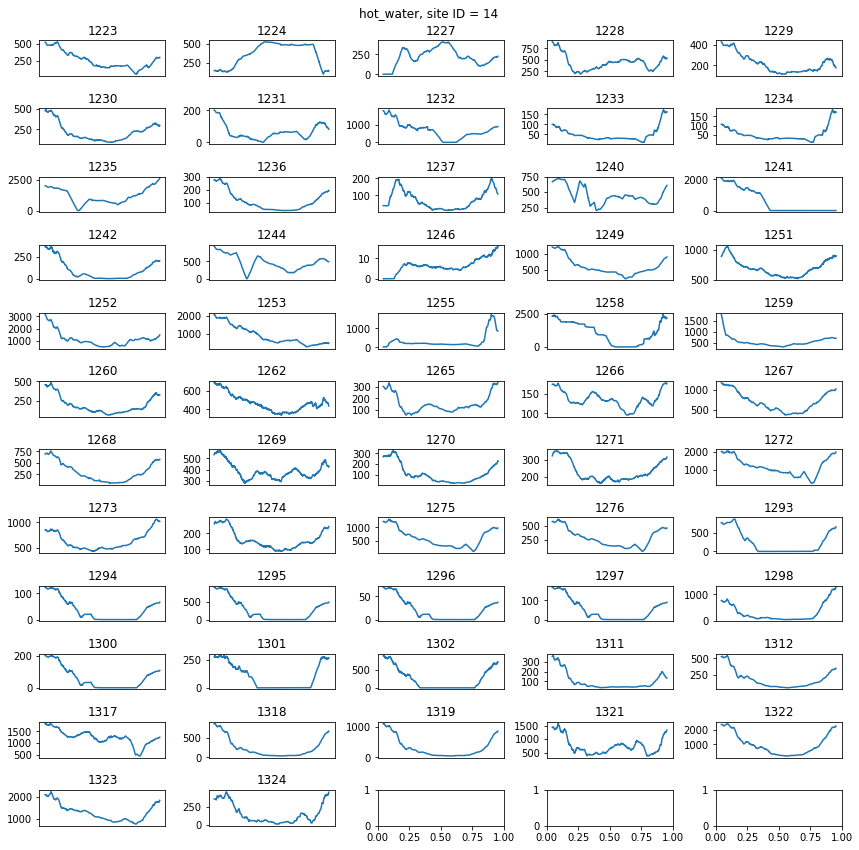

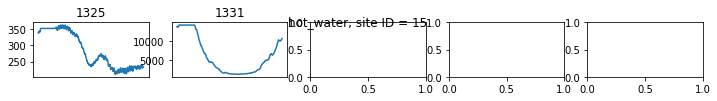

In [7]:
plot_energy_readings_by_meter(3,720)

## 2.7 Correlations with Features<a id='2.7_Correlations_with_Features'></a>

### 2.7.1 Correlations with air temperature and building size<a id='2.7.1_Correlations_with_air_temperature_and_building_size'></a>

While we have several features for modeling, the main two that more logically could determine energy consumption are air temperature and size of the building. We will explore how these correlate with energy consumption in the next few cells.

#### Energy consumption vs. air temperature

Some things we should expect to see:
1. Higher hot water and steam use during colder temperatures
2. Higher chilled water use during warmer temperatures
3. Higher electricity usage in colder and warmer temperatures

We will see that the plots are not very informative. However, for **chilled water**, we do see higher usage for higher temperatures.

Now, having seen these plots, it makes sense that there is greater variation in the meter readings which is likely due to other factors like the size of the building.

Something that may more informative is to plot the moving averages for the meter_readings and air_temperature

#### Energy consumption vs. size of building

We should expect to see bigger buildings to use more energy. Here we will look at the meter readings as well as total energy usage for the year. 
- The plots with the meter readings are not very informative. 
- The plots with the total energy usage show that generally, bigger buildings do tend to consume more energy when we take the log of the total energy usage

#### meter readings vs. air temperature and square feet

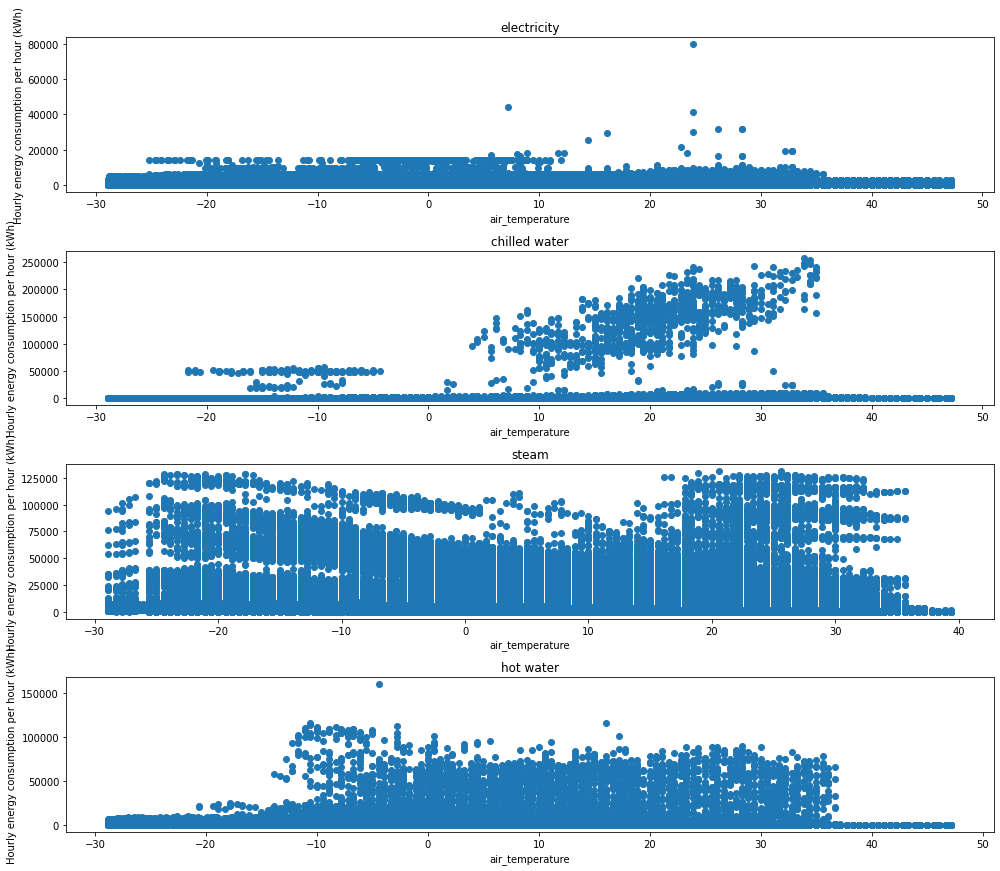

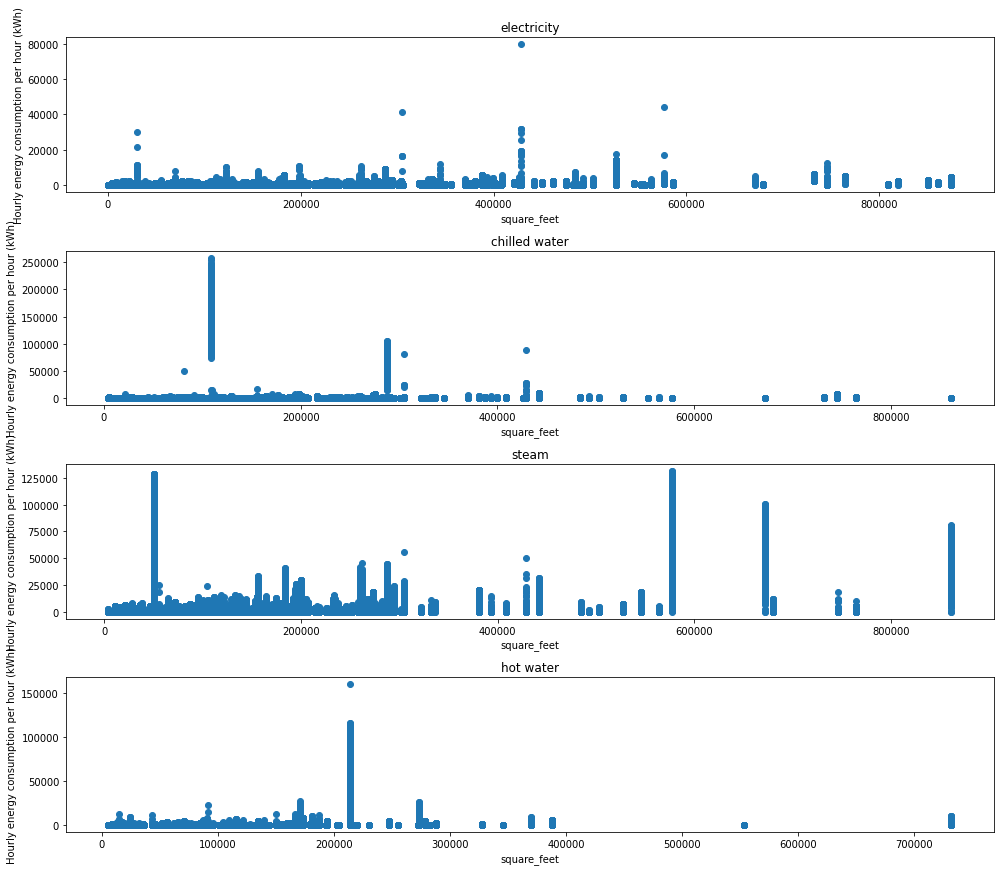

In [5]:
meters=[0,1,2,3]
meter_types={0:'electricity',1:'chilled water',2:'steam',3:'hot water'}
features=['air_temperature','square_feet']

for feature in features:
    fig, ax = plt.subplots(4,1,figsize=(14,12))
    for i in range(len(meters)):
        meter=meters[i]
        if meter == 2:
            single_meter_data=data[(data.meter==meter) & (data.building_id != 1099)]
        else:
            single_meter_data=data[data.meter==meter]
        air_temperature=single_meter_data[feature]
        meter_reading=single_meter_data.meter_reading
        ax[i].scatter(air_temperature,meter_reading)
        ax[i].set_title(meter_types[meter])
        ax[i].set_xlabel(feature)
        ax[i].set_ylabel('Hourly energy consumption per hour (kWh)')
    plt.tight_layout()
    plt.show()

#### Correlation between total energy consumption and size of building

can we see any sort of clustering? for example, do smaller buildings consume less energy? this will obviously depend on the weather as well.

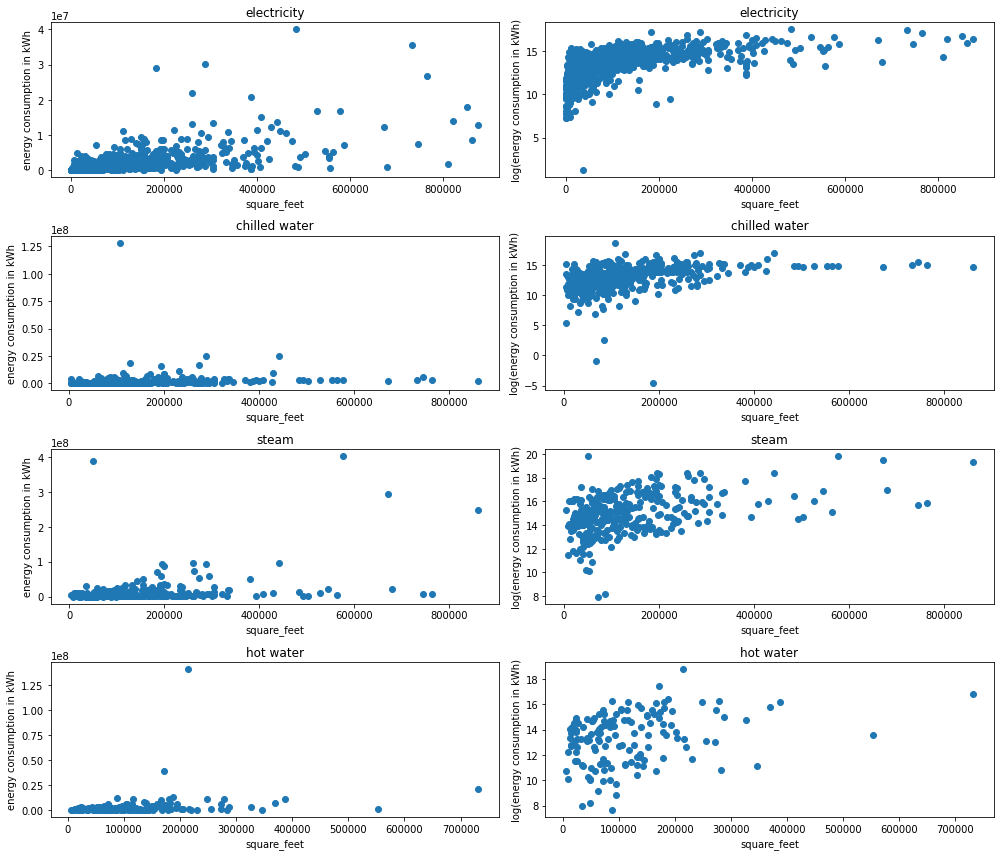

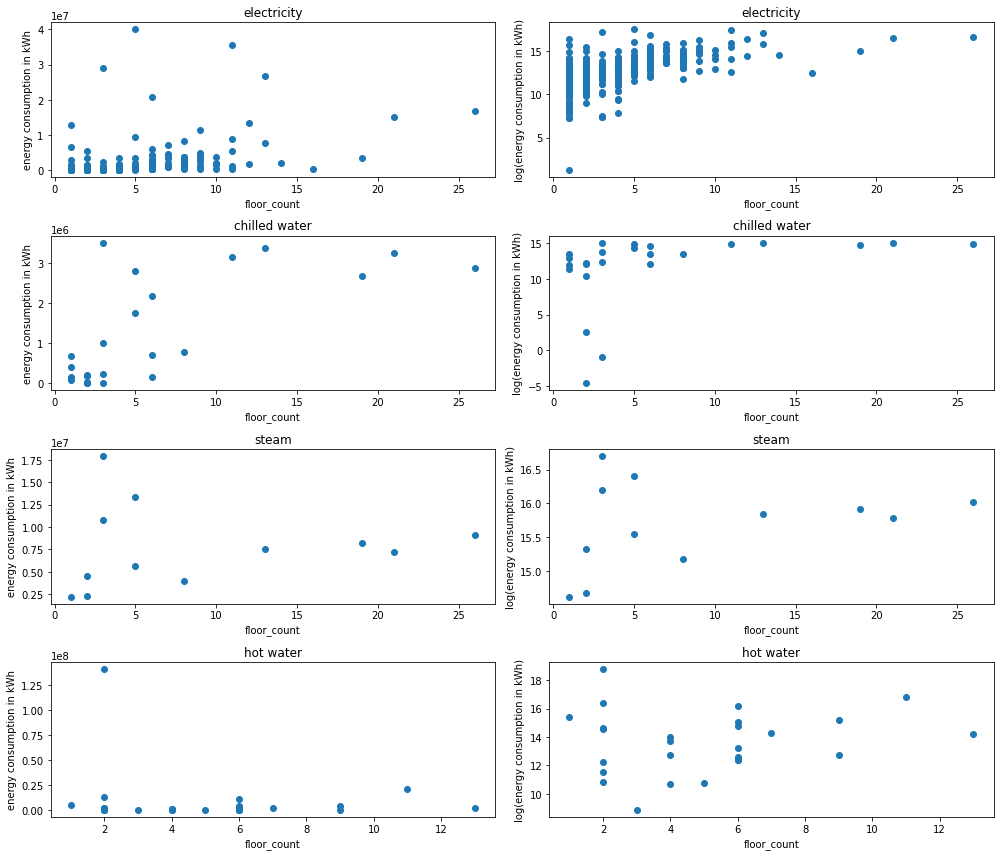

In [81]:
meters=[0,1,2,3]
meter_types={0:'electricity',1:'chilled water',2:'steam',3:'hot water'}


features=['square_feet','floor_count']

for feature in features:
    fig, ax = plt.subplots(4,2,figsize=(14,12))
    for i in range(len(meters)):
        meter=meters[i]
        if meter == 2:
            single_meter_data=data[(data.meter==meter) & (data.building_id != 1099)]
        else:
            single_meter_data=data[data.meter==meter]
        meter_reading_sum=single_meter_data.groupby('building_id').sum()['meter_reading'].reset_index()
        meter_reading_sum['total_meter_reading_log']=np.log(meter_reading_sum['meter_reading'])
        meter_reading_sum_and_building_size=meter_reading_sum.merge(building_metadata,on='building_id')
        targets=['meter_reading','total_meter_reading_log']
        for j in range(2):
            meter_reading=meter_reading_sum_and_building_size[targets[j]]
            target=meter_reading_sum_and_building_size[feature]
            if j == 1:
                ylabel='log(energy consumption in kWh)'
            else:
                ylabel='energy consumption in kWh'
            ax[i][j].scatter(target,meter_reading)
            ax[i][j].set_title(meter_types[meter])
            ax[i][j].set_xlabel(feature)
            ax[i][j].set_ylabel(ylabel)
    plt.tight_layout()
    plt.show()

#### Energy consumption/square_feet vs. air_temperature<a id='2.7.1_Correlations_with_air_temperature_and_building_size'></a>

To look at how energy consumption varies with air temperature more clearly, here I decided to get energy consumption per square footage and plot that against air temperature.

We only see somewhat of a correlation between chilled water usage vs. air temperature, and steam usage vs. air temperature. 

* as temperature increases, chilled water use increases. This makes sense. The hotter it is, the more chilled water will be used to cool down the building. We also see that we don't need chilled water use below a temperature of about 5 C.

* as temperature increase, steam use decreases. This makes sense. The warmer it is, the less steam we need to warm up the building. If steam is used, it plateaus at about ~ 25 C

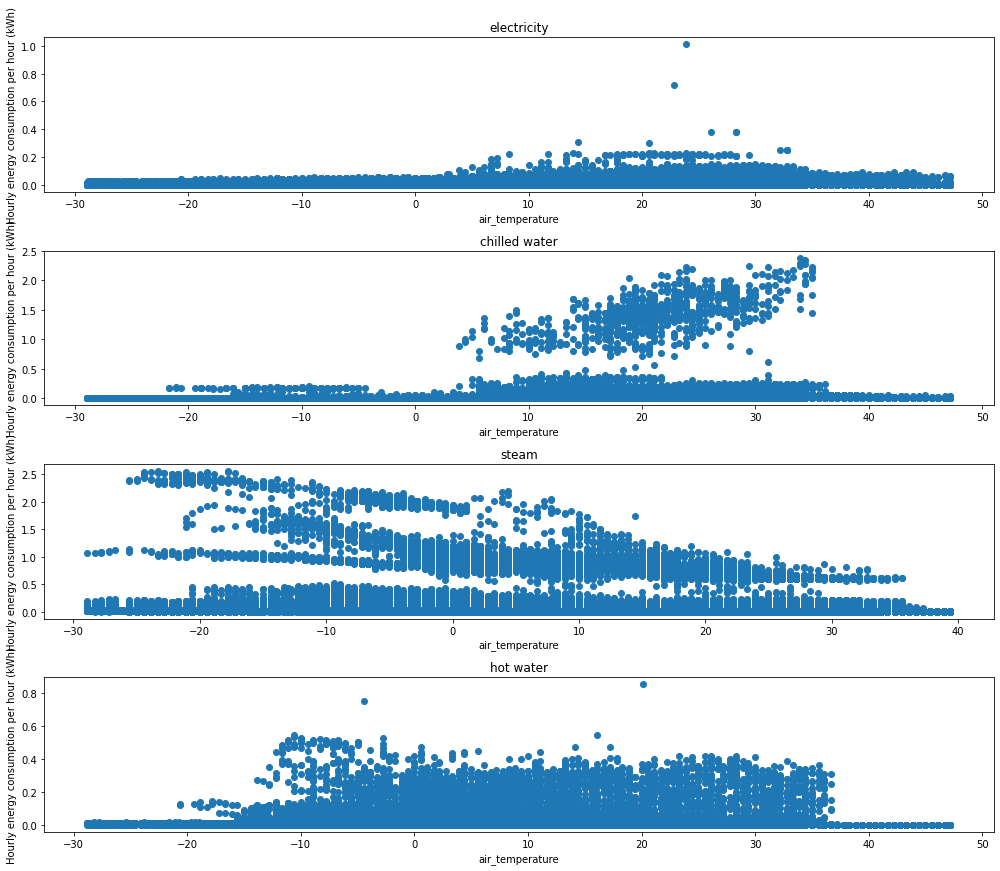

In [8]:
meters=[0,1,2,3]
meter_types={0:'electricity',1:'chilled water',2:'steam',3:'hot water'}
features=['air_temperature']

for feature in features:
    fig, ax = plt.subplots(4,1,figsize=(14,12))
    for i in range(len(meters)):
        meter=meters[i]
        if meter == 2:
            single_meter_data=data[(data.meter==meter) & (data.building_id != 1099)]
        else:
            single_meter_data=data[data.meter==meter]
        air_temperature=single_meter_data[feature]
        meter_reading=single_meter_data.consumption_per_square_feet
        ax[i].scatter(air_temperature,meter_reading)
        ax[i].set_title(meter_types[meter])
        ax[i].set_xlabel(feature)
        ax[i].set_ylabel('Hourly energy consumption per hour (kWh)')
    plt.tight_layout()
    plt.show()